In [276]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Ignore warnings
import warnings
warnings.filterwarnings("ignore")

In [277]:
train_df_cleaned = pd.read_csv('../cleaned_dataset/train_with_species.csv')
spray_df_cleaned = pd.read_csv('../cleaned_dataset/spray.csv')

In [278]:
print("train_df_cleaned dataset:")
display(train_df_cleaned.head())

train_df_cleaned dataset:


,species,date,block,latitude,longitude,addressaccuracy,nummosquitos,wnvpresent,tmax_stn1,tmin_stn1,...,street_ W OHARE,street_ W OHARE AIRPORT,street_ W PERSHING RD,street_ W ROOSEVELT,street_ W ROSCOE ST,street_ W STRONG ST,street_ W SUNNYSIDE AVE,street_ W WEBSTER AVE,street_others,trap
0,CULEX PIPIENS/RESTUANS,29/5/2007,41,41.954690,-87.800991,9,1,0,88,60,...,0,0,0,0,0,0,0,0,0,T002
1,CULEX RESTUANS,29/5/2007,41,41.954690,-87.800991,9,1,0,88,60,...,0,0,0,0,0,0,0,0,0,T002
2,CULEX RESTUANS,29/5/2007,62,41.994991,-87.769279,9,1,0,88,60,...,0,0,0,0,0,0,0,0,0,T007
3,CULEX PIPIENS/RESTUANS,29/5/2007,79,41.974089,-87.824812,8,1,0,88,60,...,0,0,0,0,0,0,0,0,0,T015
4,CULEX RESTUANS,29/5/2007,79,41.974089,-87.824812,8,4,0,88,60,...,0,0,0,0,0,0,0,0,0,T015


In [279]:
train_df_cleaned.select_dtypes(exclude='number').columns

Index(['species', 'date', 'trap'], dtype='object')

In [280]:
train_df_cleaned.select_dtypes(exclude='object').columns

Index(['block', 'latitude', 'longitude', 'addressaccuracy', 'nummosquitos',
       'wnvpresent', 'tmax_stn1', 'tmin_stn1', 'tavg_stn1', 'depart_stn1',
       ...
       'street_ W MONTROSE DR', 'street_ W OHARE', 'street_ W OHARE AIRPORT',
       'street_ W PERSHING RD', 'street_ W ROOSEVELT', 'street_ W ROSCOE ST',
       'street_ W STRONG ST', 'street_ W SUNNYSIDE AVE',
       'street_ W WEBSTER AVE', 'street_others'],
      dtype='object', length=168)

In [281]:
train_df_cleaned.corr().sort_values("wnvpresent", ascending=False)['wnvpresent'].head(55)

wnvpresent                   1.000000
nummosquitos                 0.196820
sunrise_stn1                 0.105227
month                        0.100143
dewpoint_stn1                0.090460
wetbulb_stn1                 0.082938
dewpoint_stn2                0.080873
wetbulb_stn2                 0.077728
tmin_stn2                    0.074459
tmin_stn1                    0.072719
tavg_stn1                    0.066043
tavg_stn2                    0.062072
cool_stn1                    0.058953
cool_stn2                    0.056728
depart_stn1                  0.055436
year                         0.050865
tmax_stn1                    0.050536
tmax_stn2                    0.045755
street_ W OHARE AIRPORT      0.044220
preciptotal_stn2             0.039370
street_ N OAK PARK AVE       0.038128
street_ N MILWAUKEE AVE      0.030296
latitude                     0.028697
street_ N HARLEM AVE         0.027159
street_ N AVONDALE AVE       0.024517
street_ S DOTY AVE           0.024272
street_ S KO

The below EDA sections comprise the following:

1. Breakdown of West Nile Virus Presence among mosquito species
2. Check target class of wnvpresent : 0 and 1
3. Check breakdown of West Nile Virus presence by year
4. Check month vs West Nile Virus Presence
5. Check average temperature vs West Nile Virus Presence
6. Check wet bulb temperature vs West Nile Virus Presence
7. Check dewpoint vs West Nile Virus Presence
8. Check hours of daytime vs West Nile Virus Presence
9. Check precipitation vs West Nile Virus Presence
10. Check station pressure vs West Nile Virus Presence
11. Check sea level pressure vs West Nile Virus Presence
12. Check average wind speed vs West Nile Virus Presence
13. Using geographic data to visualise the locations of West Nile Virus density
14. Checking possible effects of spraying

## 1. Breakdown of West Nile Virus Presence among mosquito species

In [282]:
species_distribution = train_df_cleaned[["species", "nummosquitos", "wnvpresent"]].groupby("species").sum()
species_distribution["% wnvpresent"] = (species_distribution["wnvpresent"] / species_distribution["nummosquitos"]) * 100
species_distribution

,nummosquitos,wnvpresent,% wnvpresent
species,,,
CULEX ERRATICUS,7,0,0.000000
CULEX PIPIENS,44671,240,0.537261
CULEX PIPIENS/RESTUANS,66268,262,0.395364
CULEX RESTUANS,23431,49,0.209125
CULEX SALINARIUS,145,0,0.000000
CULEX TARSALIS,7,0,0.000000
CULEX TERRITANS,510,0,0.000000


West Nile Virus is only present in CULEX PIPIENS/RESTUANS, CULEX PIPIENS and CULEX RESTUANS	species

### Plot a barplot for West Nile Virus present mosquitoes per species

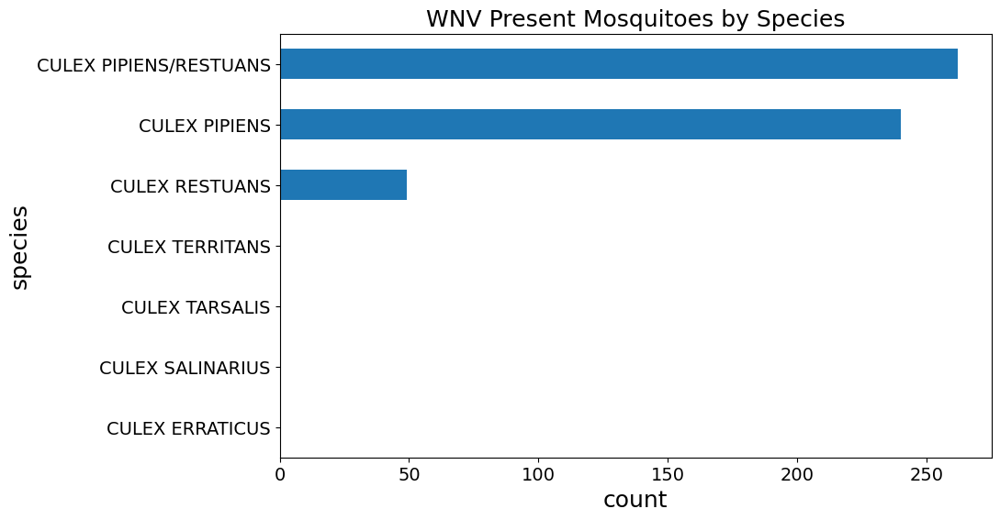

In [283]:
plt.figure(figsize=(10,6))

species_distribution['wnvpresent'].sort_values(ascending=True).plot(kind='barh')
plt.xlabel("count", fontsize=18)
plt.ylabel("species", fontsize=18)
plt.tick_params(labelsize=14)
plt.title("WNV Present Mosquitoes by Species", fontsize=18);

### Plot a barplot for WNV Present Mosquitoes by Species as a Percentage of its Own Population

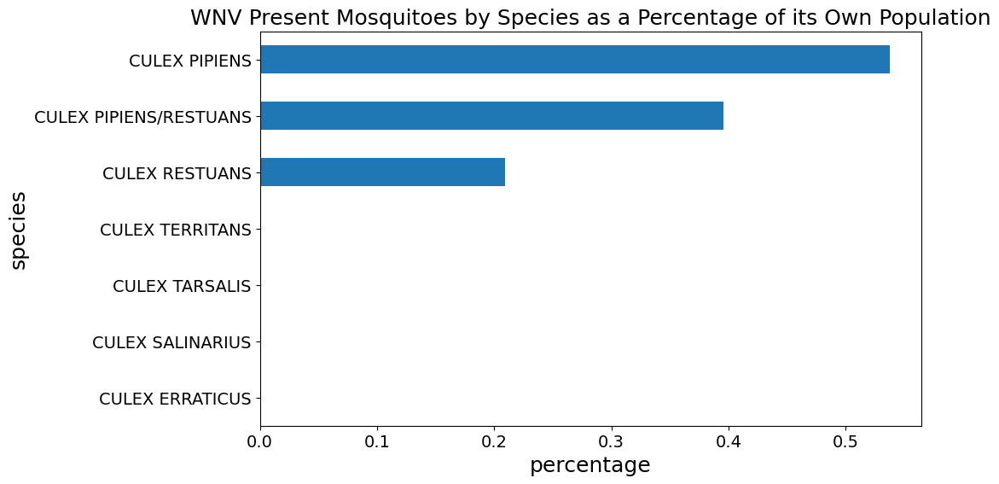

In [284]:
plt.figure(figsize=(10,6))

species_distribution['% wnvpresent'].sort_values(ascending=True).plot(kind='barh')
plt.xlabel("percentage", fontsize=18)
plt.ylabel("species", fontsize=18)
plt.tick_params(labelsize=14)
plt.title("WNV Present Mosquitoes by Species as a Percentage of its Own Population", fontsize=18);

CULEX PIPIENS/RESTUANS has slightly higher count of West Nile Virus present mosquitoes, but CULEX PIPIENS has a higher percentage population of mosquitoes as a species that are West Nile Virus Present.
The rest of the 4 species do not have West Nile Virus present mosquitoes. Those 4 species also make up a very small amount of mosquitoes itself as compared to CULEX PIPIENS/RESTUANS, CULEX PIPIENS and CULEX RESTUANS.

## 2. Check target class of wnvpresent : 0 and 1

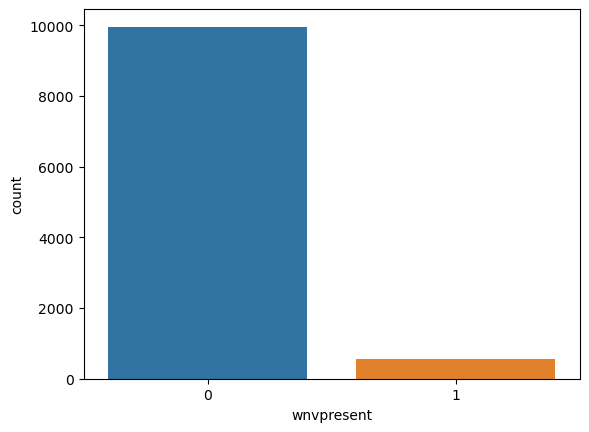

In [285]:
# Check that there are only 2 classes of values for target variable
label_categories = sns.countplot(x='wnvpresent', data=train_df_cleaned);

Target classes are imbalanced, more '0' than '1' for wnvpresent (more wnvpresent negative than positive)

## 3. Check breakdown of West Nile Virus presence by year 

In [286]:
train_df_cleaned_groupby_year = train_df_cleaned.groupby('year')['wnvpresent'].sum()
train_df_cleaned_groupby_year

year
2007    236
2009     19
2011     57
2013    239
Name: wnvpresent, dtype: int64

<Axes: xlabel='year', ylabel='wnvpresent'>

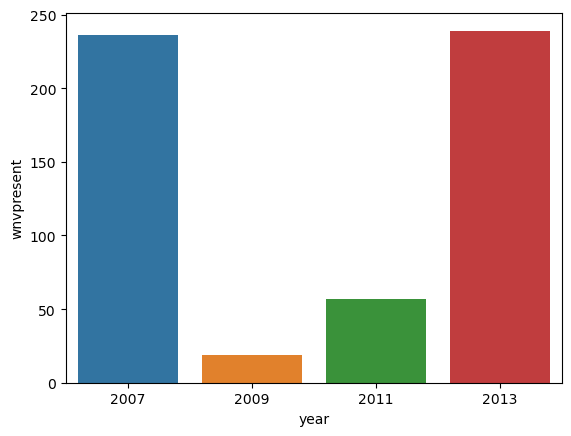

In [287]:
sns.barplot(data=train_df_cleaned.groupby(by='year').sum().reset_index(), x='year', y='wnvpresent')

2009 and 2011 had much lower West Nile Virus present numbers than 2007 and 2013

<Axes: xlabel='year', ylabel='nummosquitos'>

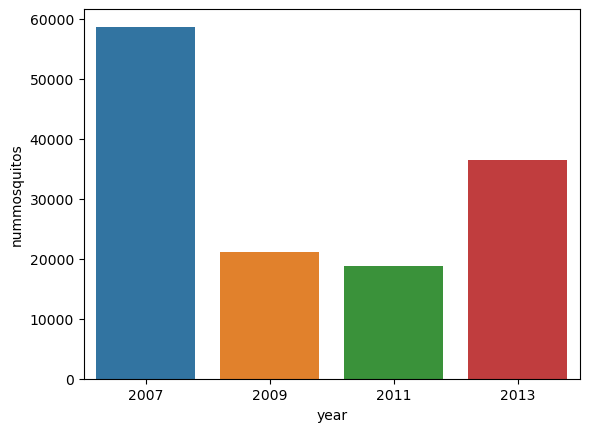

In [288]:
sns.barplot(data=train_df_cleaned.groupby(by='year').sum().reset_index(), x='year', y='nummosquitos')

2009 and 2011 still had less number of mosquitoes than 2007 and 2013. However, while 2013 had similar West Nile Virus present numbers as 2007, 2013 had a lower number of mosquitoes than 2007

In [289]:
train_df_cleaned.groupby(['year','species'])['nummosquitos'].sum()

year  species               
2007  CULEX PIPIENS             35871
      CULEX PIPIENS/RESTUANS    20565
      CULEX RESTUANS             1847
      CULEX SALINARIUS             61
      CULEX TERRITANS             344
2009  CULEX PIPIENS               867
      CULEX PIPIENS/RESTUANS    15531
      CULEX RESTUANS             4657
      CULEX SALINARIUS             26
      CULEX TARSALIS                2
      CULEX TERRITANS              25
2011  CULEX PIPIENS              1336
      CULEX PIPIENS/RESTUANS    11206
      CULEX RESTUANS             6068
      CULEX SALINARIUS             54
      CULEX TARSALIS                5
      CULEX TERRITANS             130
2013  CULEX ERRATICUS               7
      CULEX PIPIENS              6597
      CULEX PIPIENS/RESTUANS    18966
      CULEX RESTUANS            10859
      CULEX SALINARIUS              4
      CULEX TERRITANS              11
Name: nummosquitos, dtype: int64

## 4. Check month vs West Nile Virus Presence

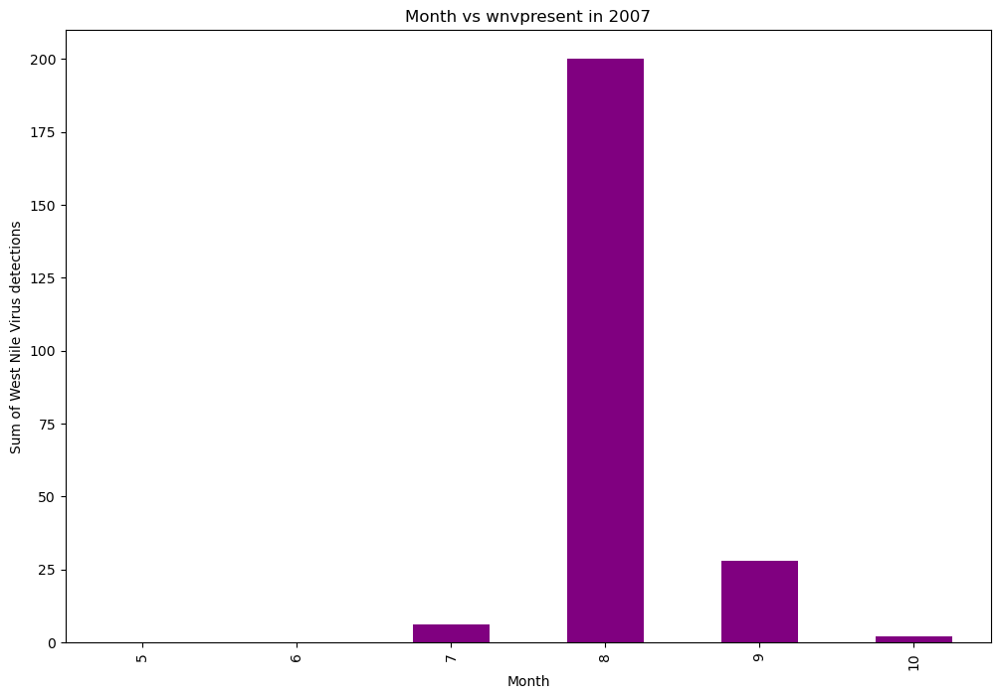

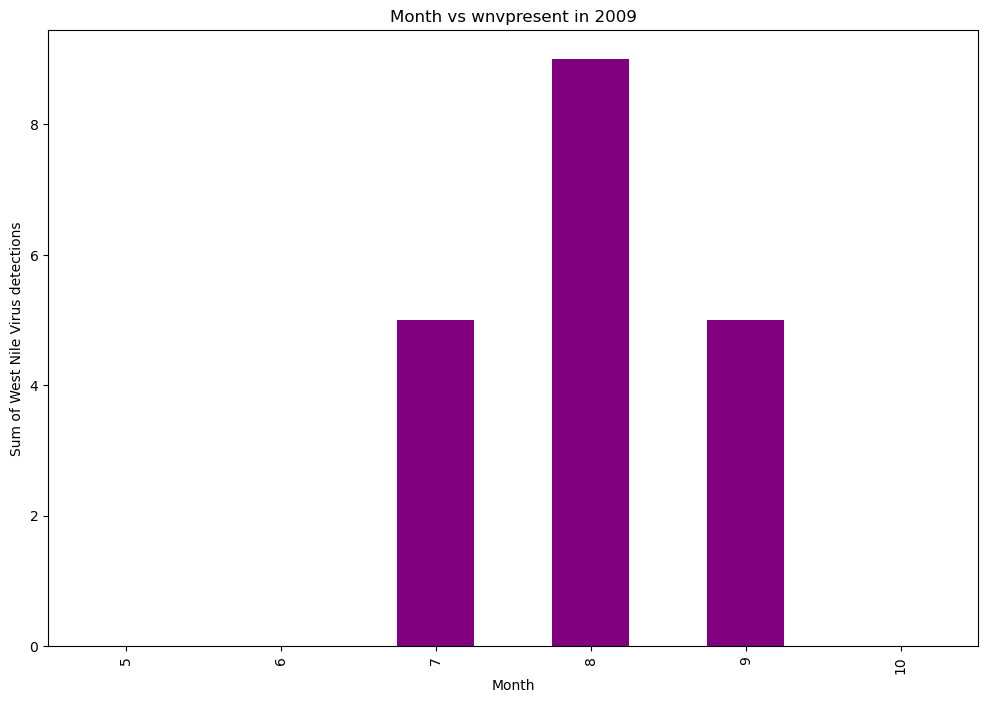

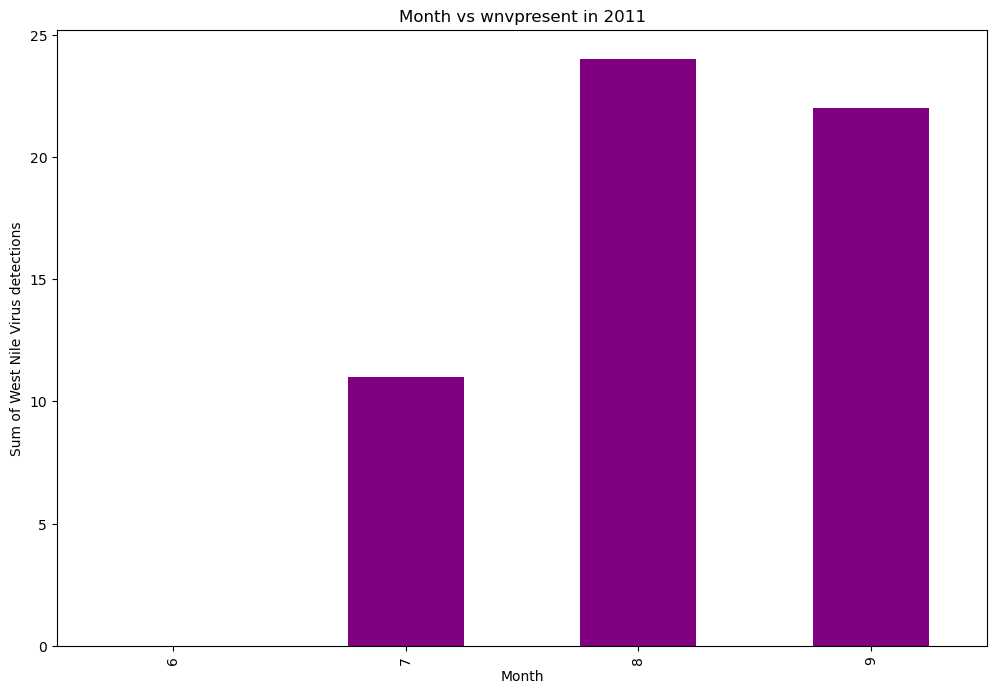

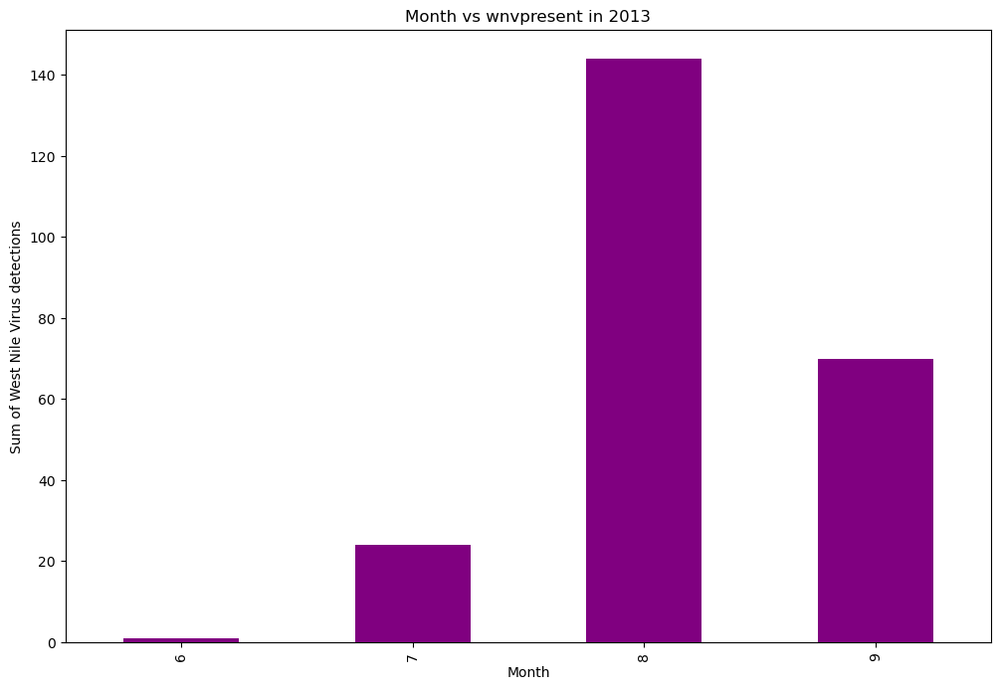

In [290]:
for x in train_df_cleaned['year'].unique():
    plt.figure(figsize=(12,8))
    train_df_cleaned[train_df_cleaned['year']==x].groupby(['month'])['wnvpresent'].sum().plot.bar(color='purple') 
    plt.title(f'Month vs wnvpresent in {x}')
    plt.xlabel('Month')
    plt.xticks(rotation=90)
    plt.ylabel('Sum of West Nile Virus detections')

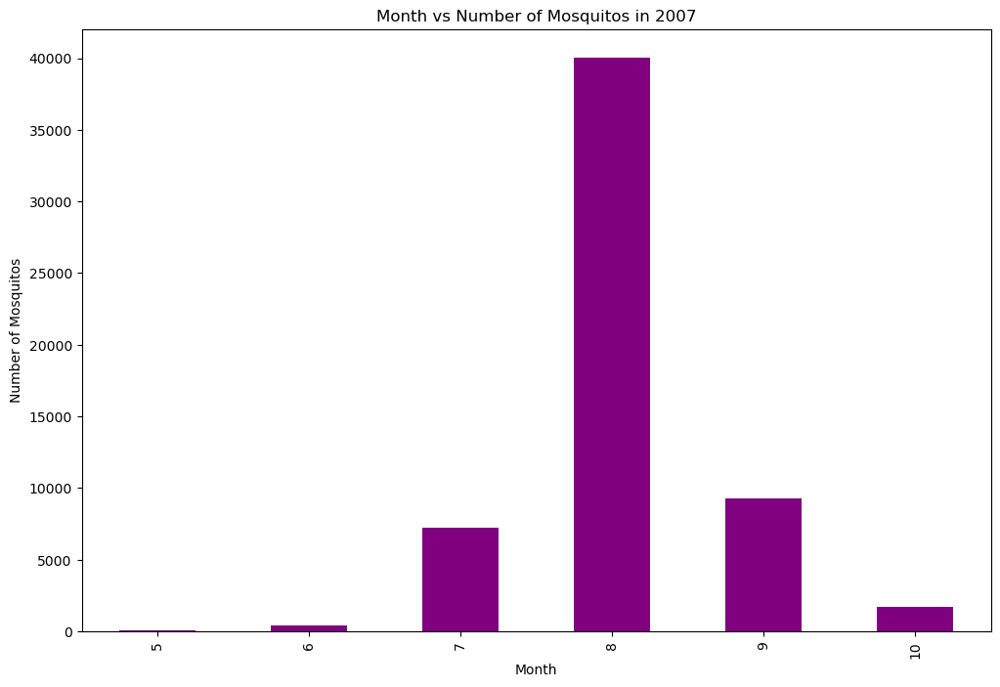

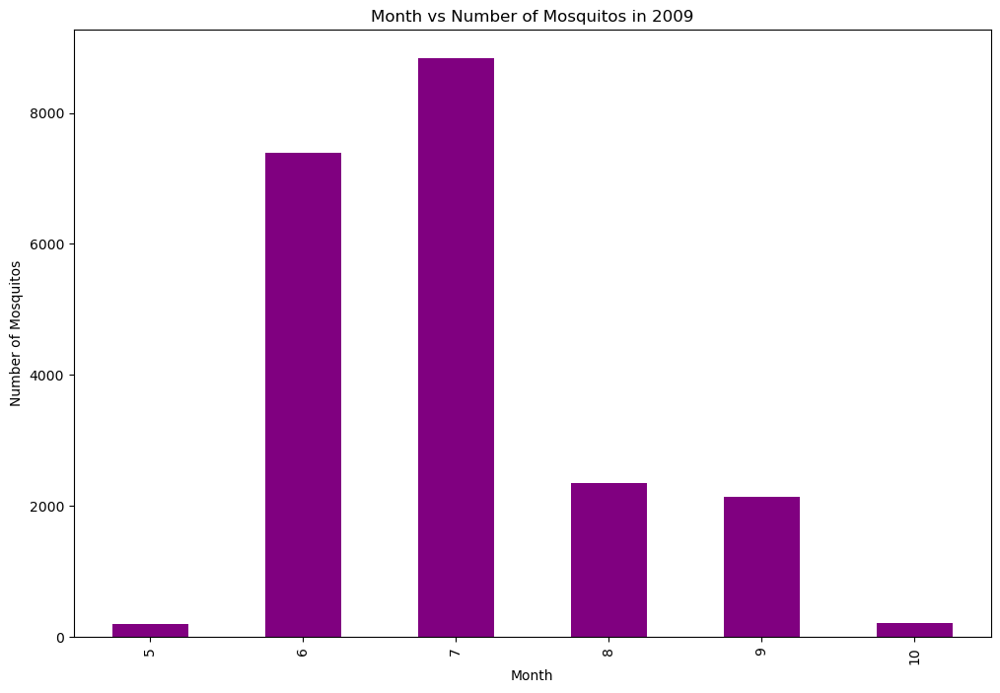

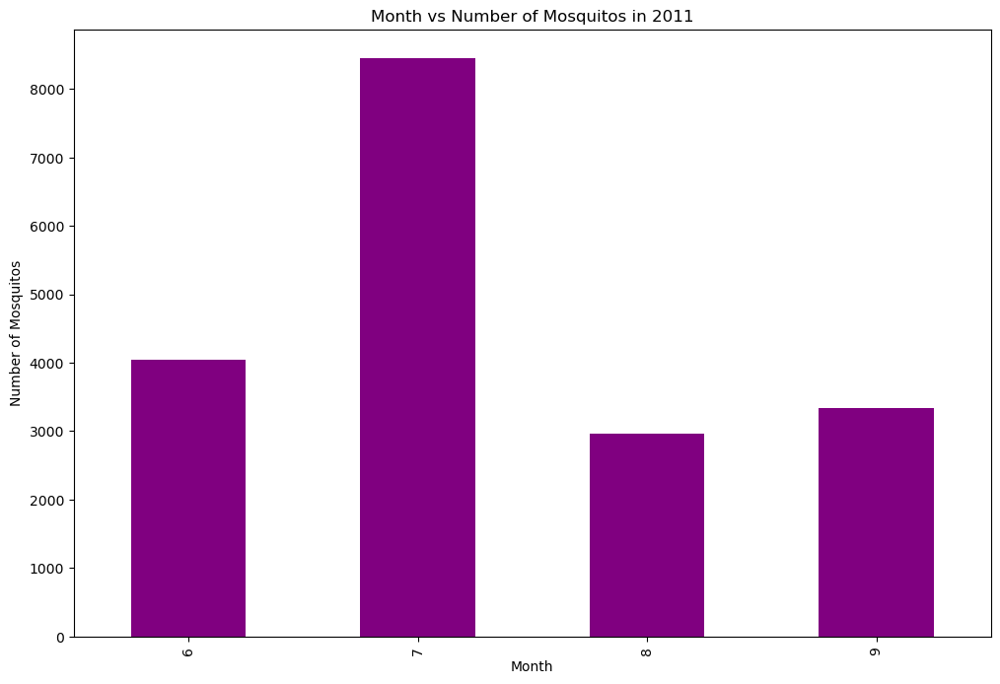

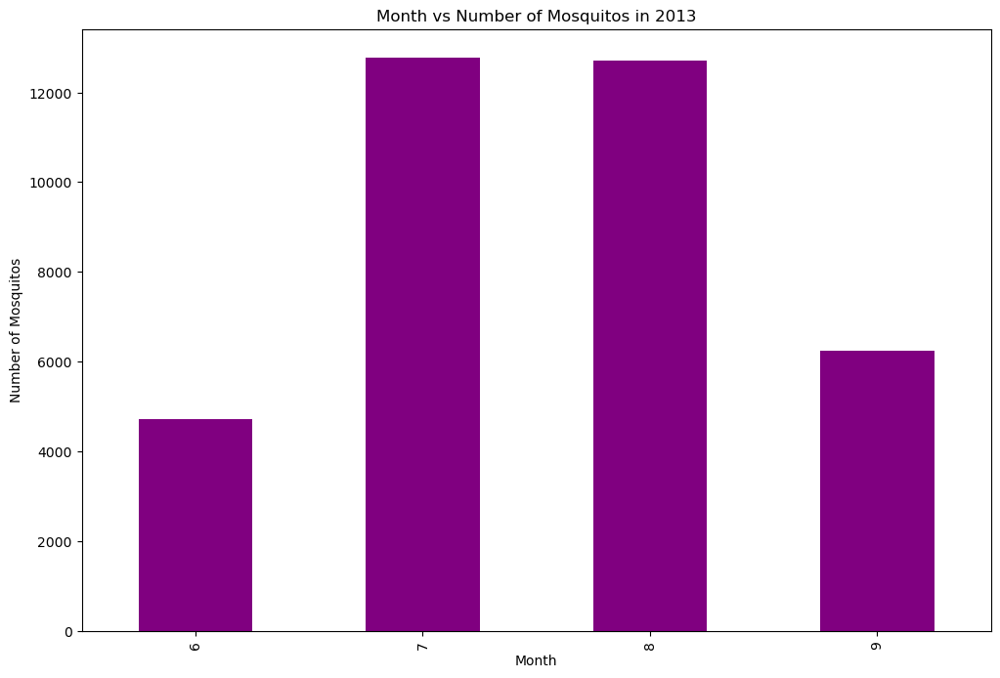

In [291]:
for x in train_df_cleaned['year'].unique():
    plt.figure(figsize=(12,8))
    train_df_cleaned[train_df_cleaned['year']==x].groupby(['month'])['nummosquitos'].sum().plot.bar(color='purple') 
    plt.title(f'Month vs Number of Mosquitos in {x}')
    plt.xlabel('Month')
    plt.xticks(rotation=90)
    plt.ylabel('Number of Mosquitos')

From the above bar plots, presence of West Nile Virus occurs most often in August, followed by September. 

## 5. Check average temperature vs West Nile Virus Presence

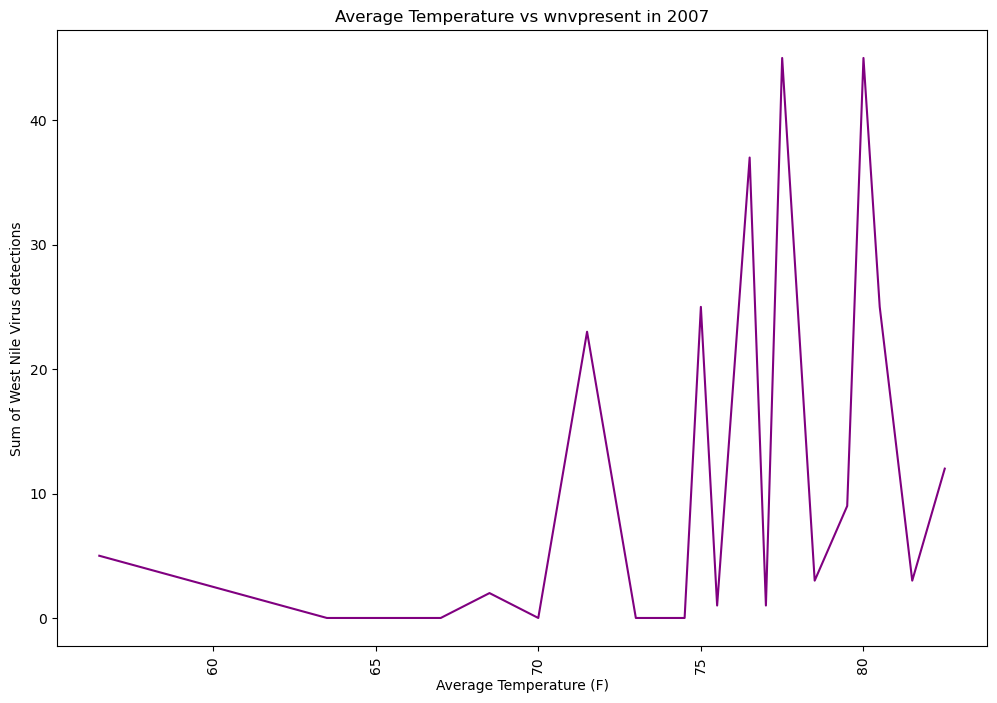

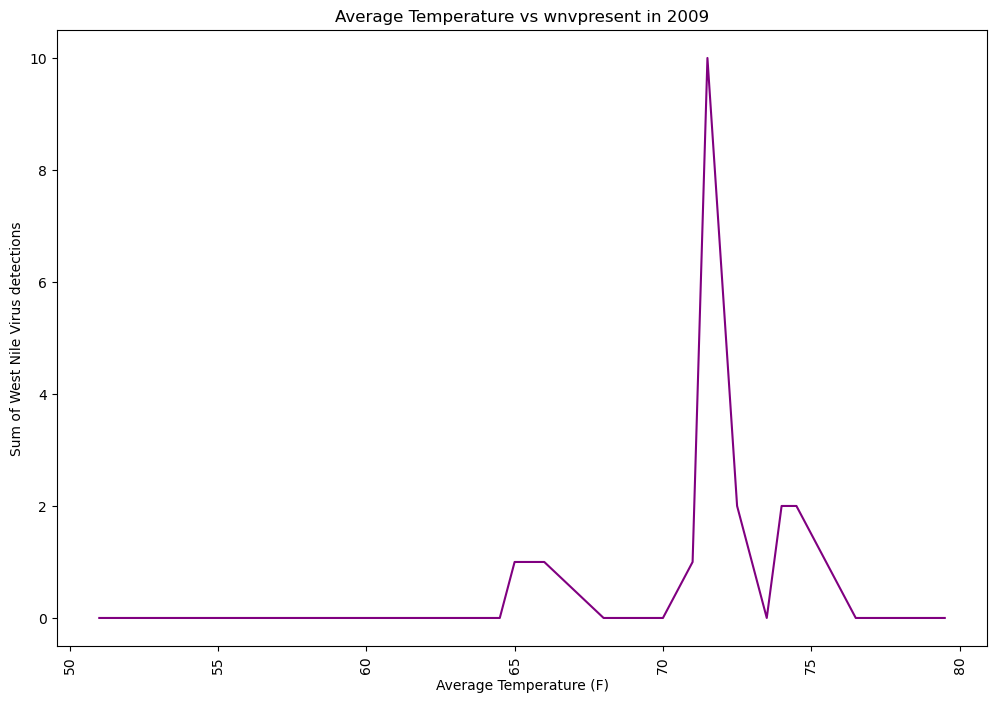

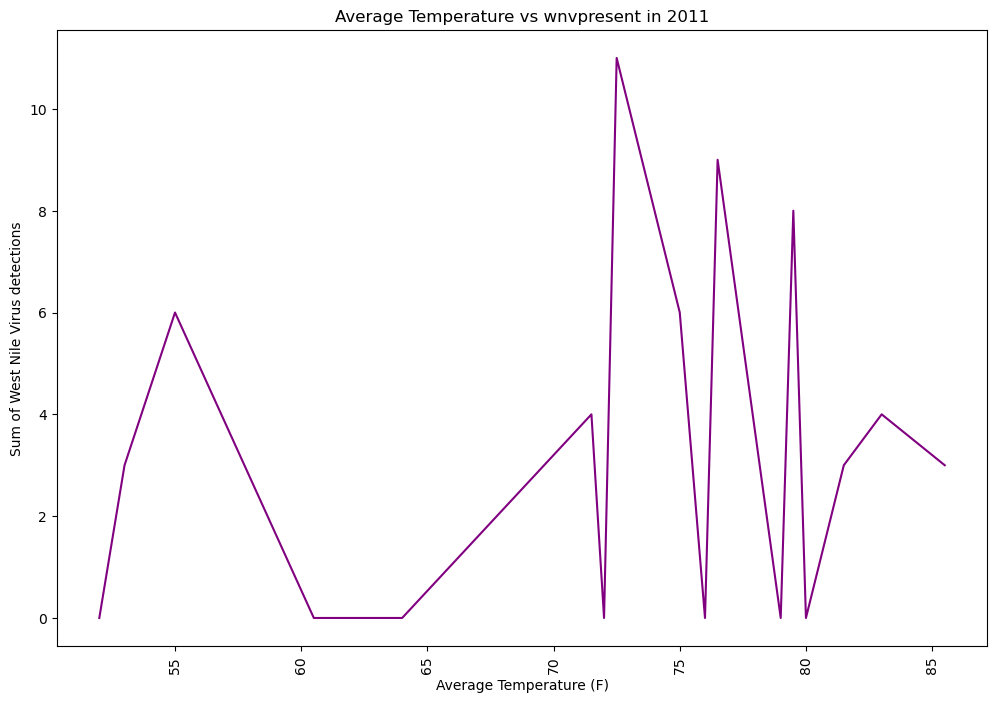

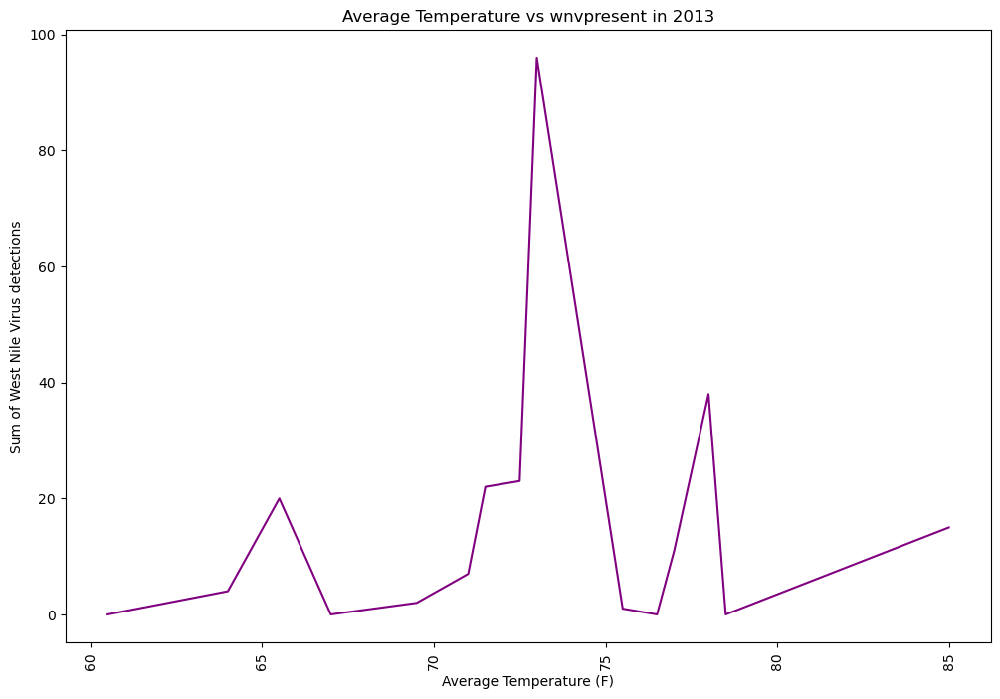

In [292]:
#train_df_cleaned_tavg_avg = train_df_cleaned
train_df_cleaned['tavg_avg'] = (train_df_cleaned['tavg_stn1'] + train_df_cleaned['tavg_stn2'])/2
for x in train_df_cleaned['year'].unique():
    plt.figure(figsize=(12,8))
    train_df_cleaned[train_df_cleaned['year']==x].groupby(['tavg_avg'])['wnvpresent'].sum().plot.line(color='purple') 
    plt.title(f'Average Temperature vs wnvpresent in {x}')
    plt.xlabel('Average Temperature (F)')
    plt.xticks(rotation=90)
    plt.ylabel('Sum of West Nile Virus detections')

From the above line plots, generally there is likely more occurence of West Nile Virus presence as the temperature rises above 70 F

## 6. Check Wet bulb temperature vs West Nile Virus Presence

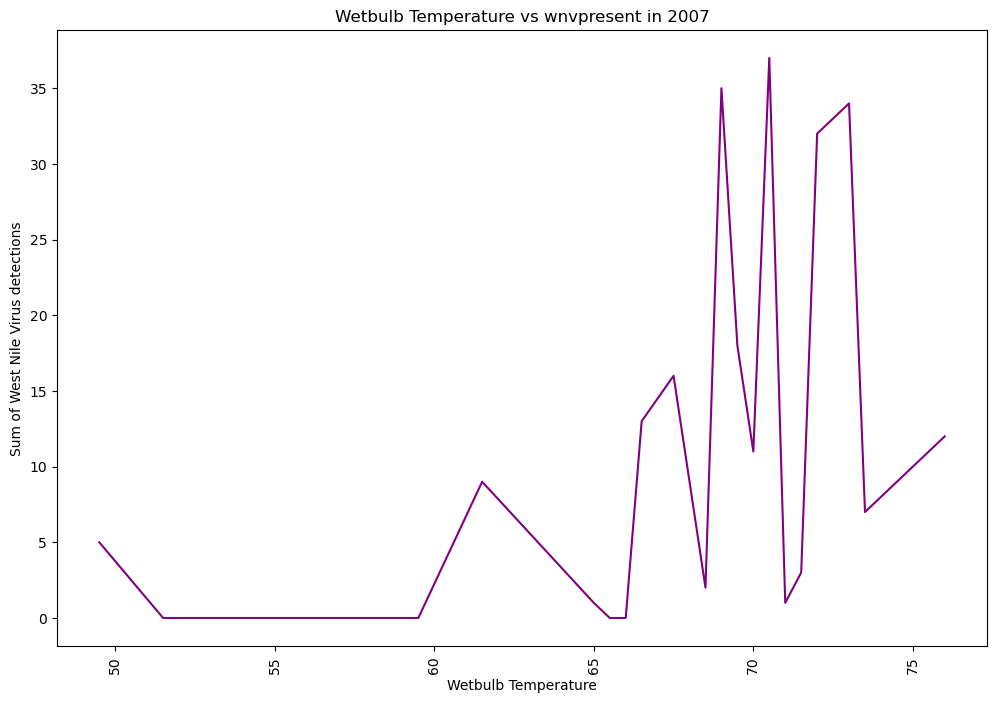

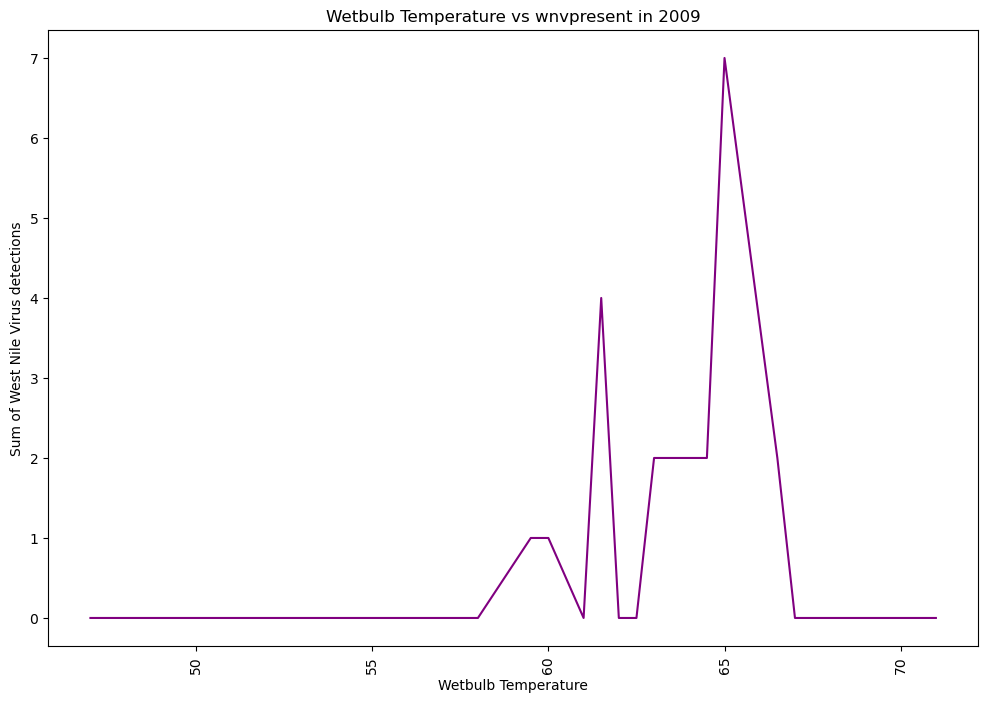

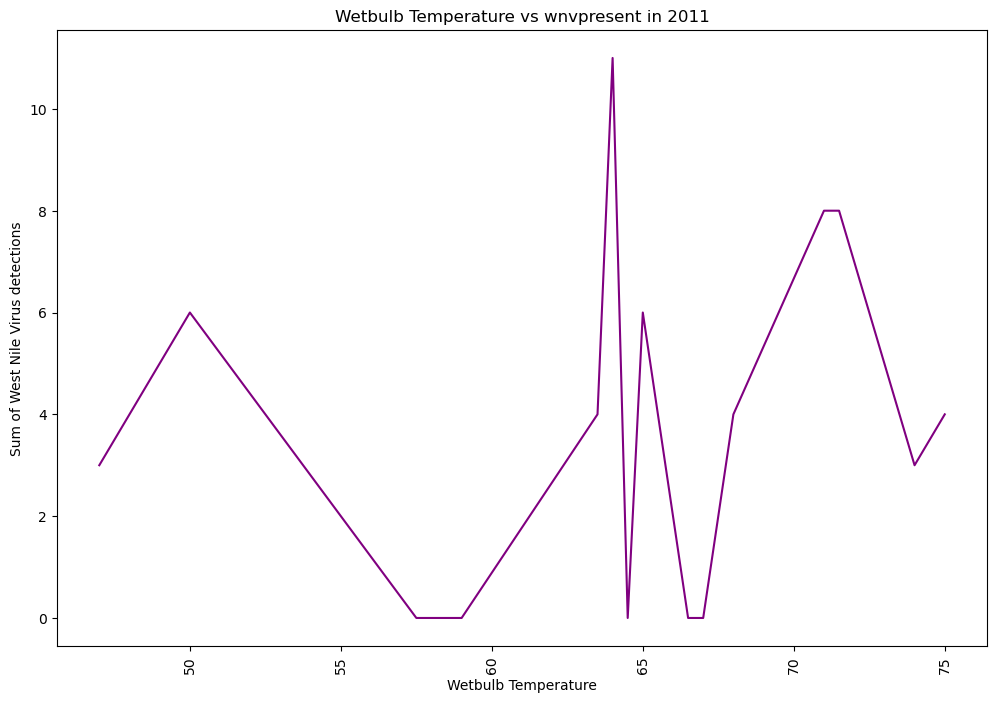

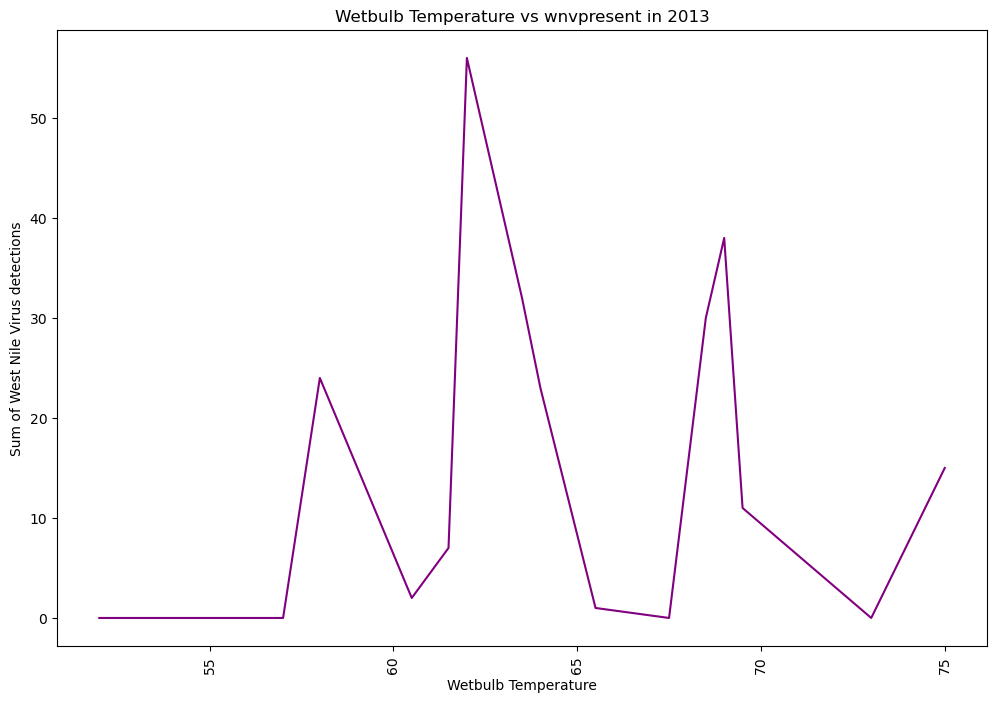

In [293]:
train_df_cleaned['wetbulb_avg'] = (train_df_cleaned['wetbulb_stn1'] + train_df_cleaned['wetbulb_stn2'])/2
for x in train_df_cleaned['year'].unique():
    plt.figure(figsize=(12,8))
    train_df_cleaned[train_df_cleaned['year']==x].groupby(['wetbulb_avg'])['wnvpresent'].sum().plot.line(color='purple') 
    plt.title(f'Wetbulb Temperature vs wnvpresent in {x}')
    plt.xlabel('Wetbulb Temperature')
    plt.xticks(rotation=90)
    plt.ylabel('Sum of West Nile Virus detections')

From the above line plots, generally the higher the wet bulb temperature, the likely the occurence of West Nile Virus being present is higher.

## 7. Check dewpoint vs West Nile Virus Presence

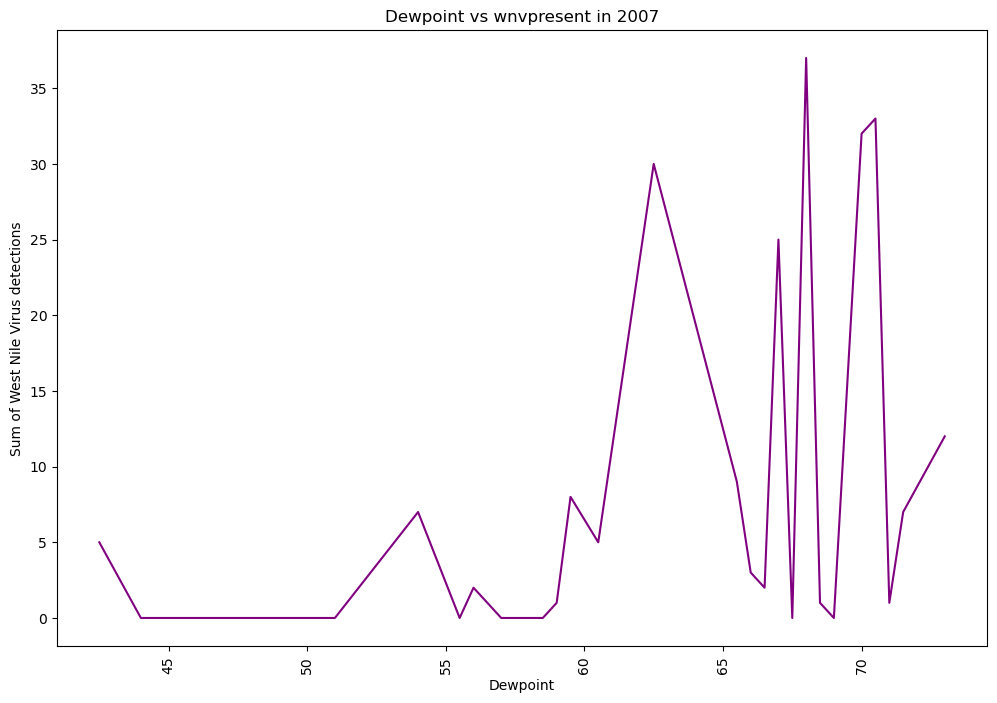

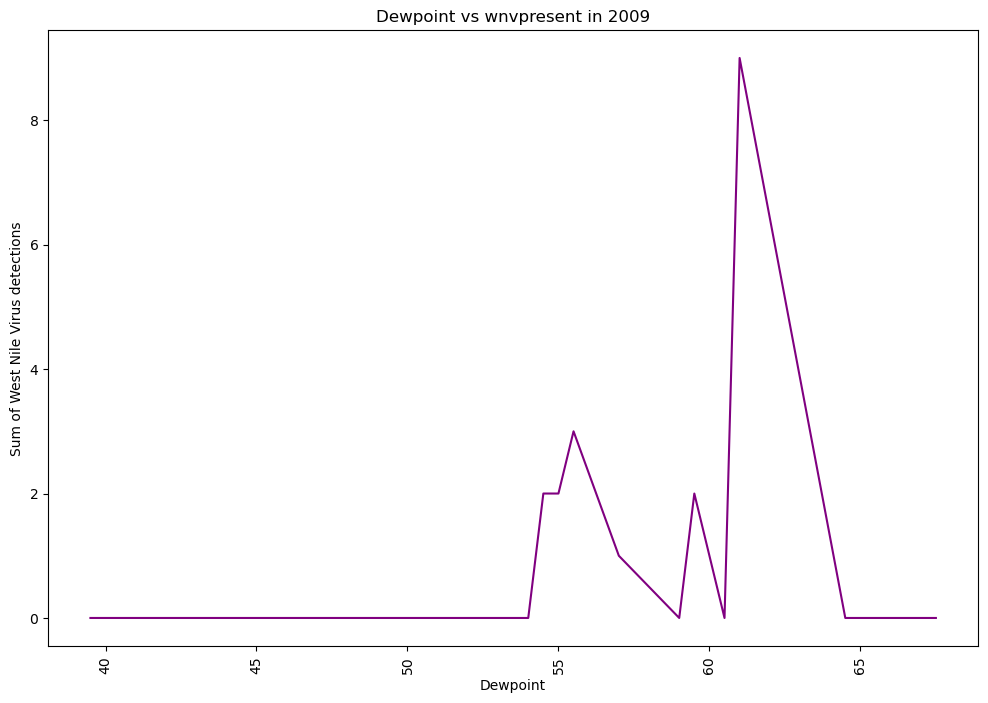

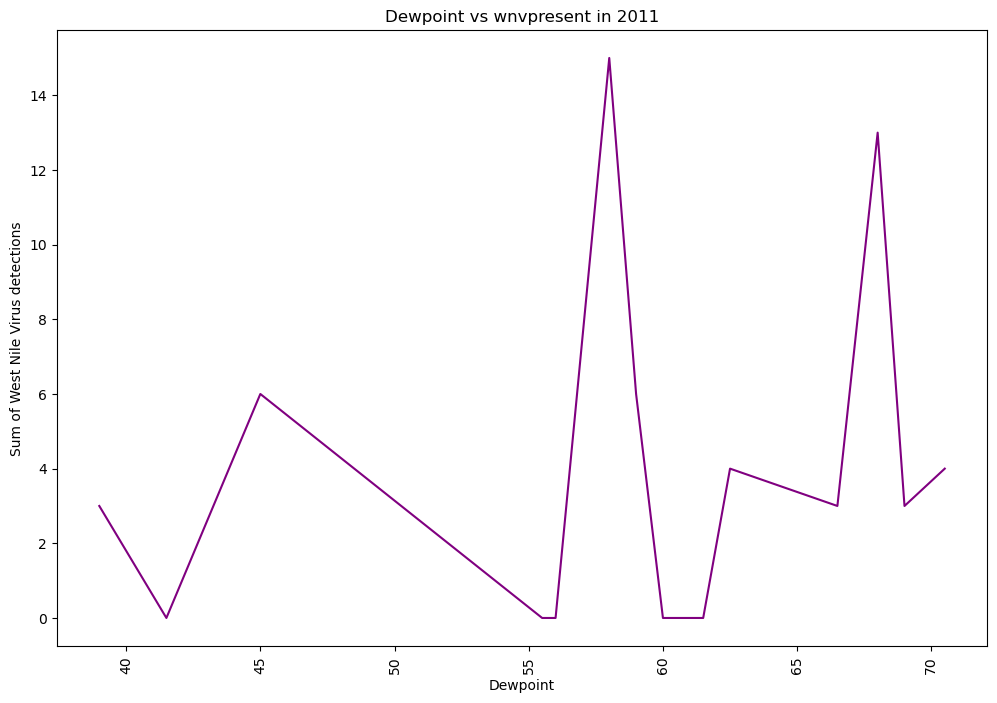

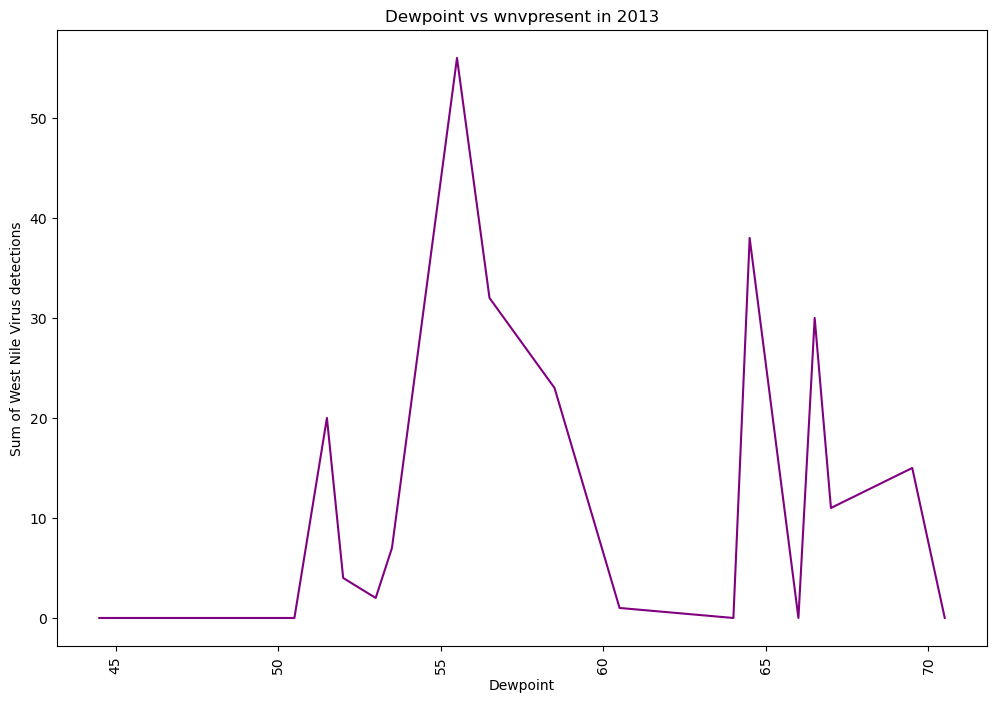

In [294]:
train_df_cleaned['dewpoint_avg'] = (train_df_cleaned['dewpoint_stn1'] + train_df_cleaned['dewpoint_stn2'])/2
for x in train_df_cleaned['year'].unique():
    plt.figure(figsize=(12,8))
    train_df_cleaned[train_df_cleaned['year']==x].groupby(['dewpoint_avg'])['wnvpresent'].sum().plot.line(color='purple') 
    plt.title(f'Dewpoint vs wnvpresent in {x}')
    plt.xlabel('Dewpoint')
    plt.xticks(rotation=90)
    plt.ylabel('Sum of West Nile Virus detections')

From the above line plots, generally the higher the dewpoint, the likely the occurence of West Nile Virus being present is higher.

## 8. Check hours of daytime vs West Nile Virus Presence

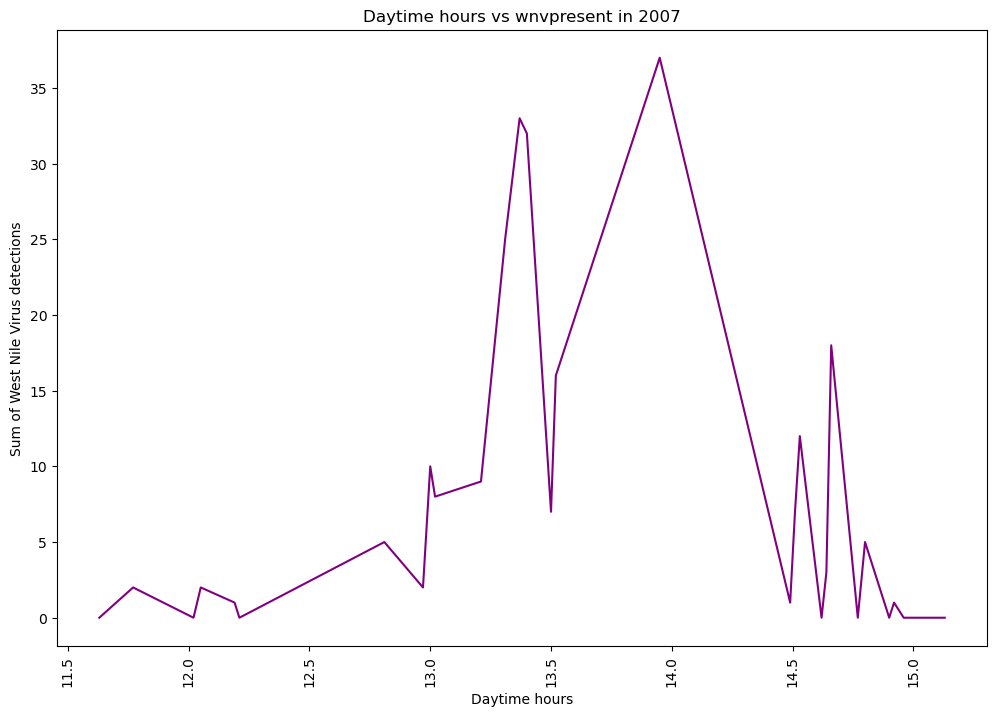

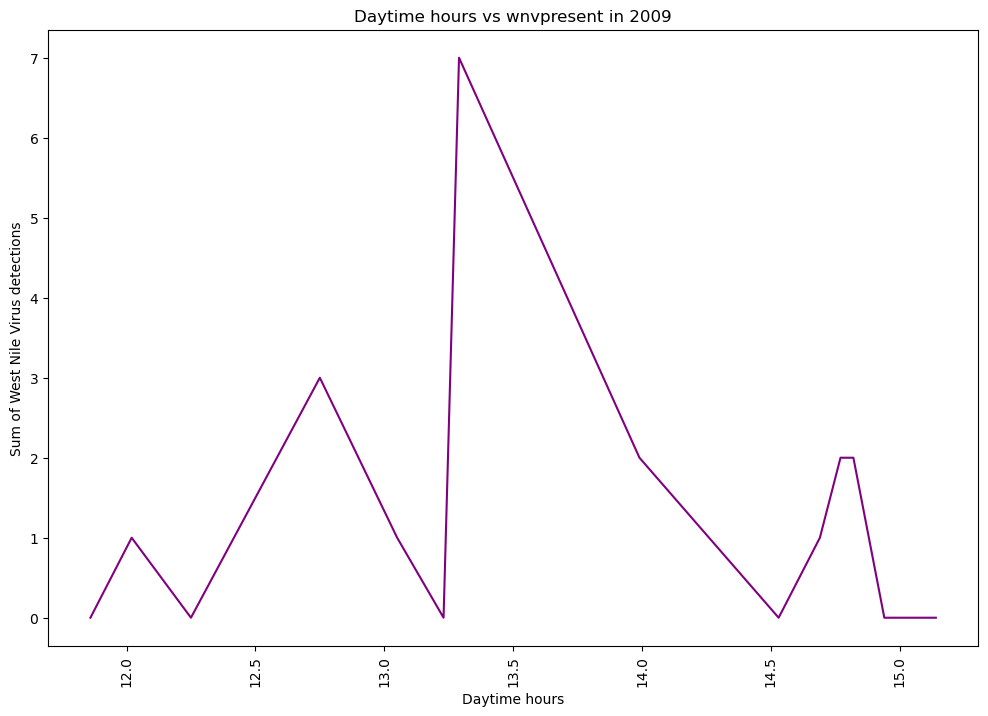

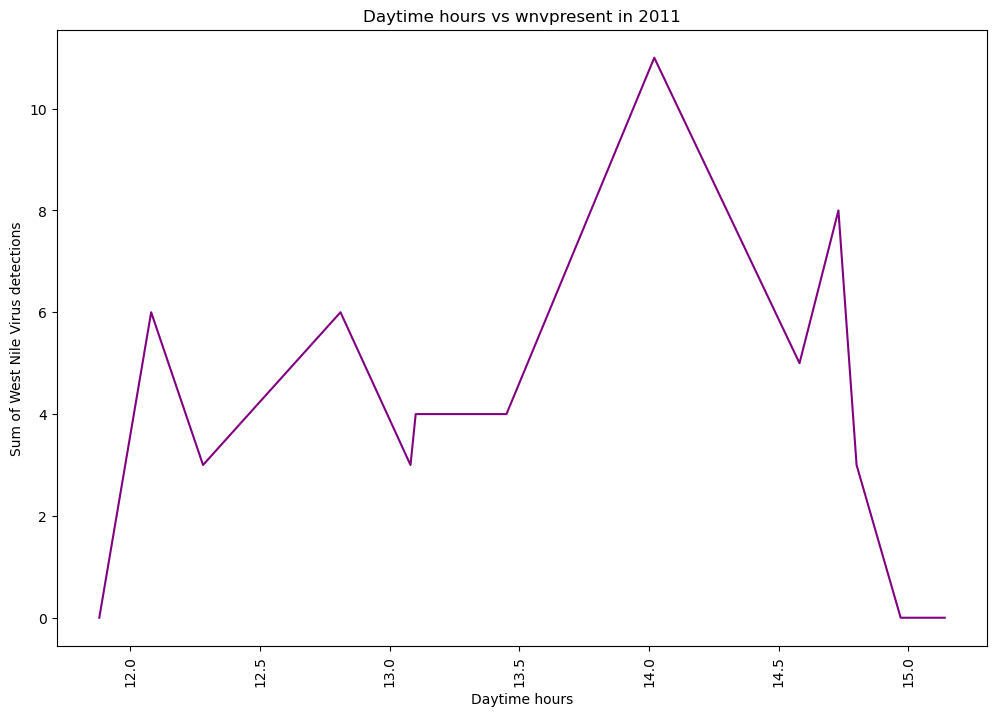

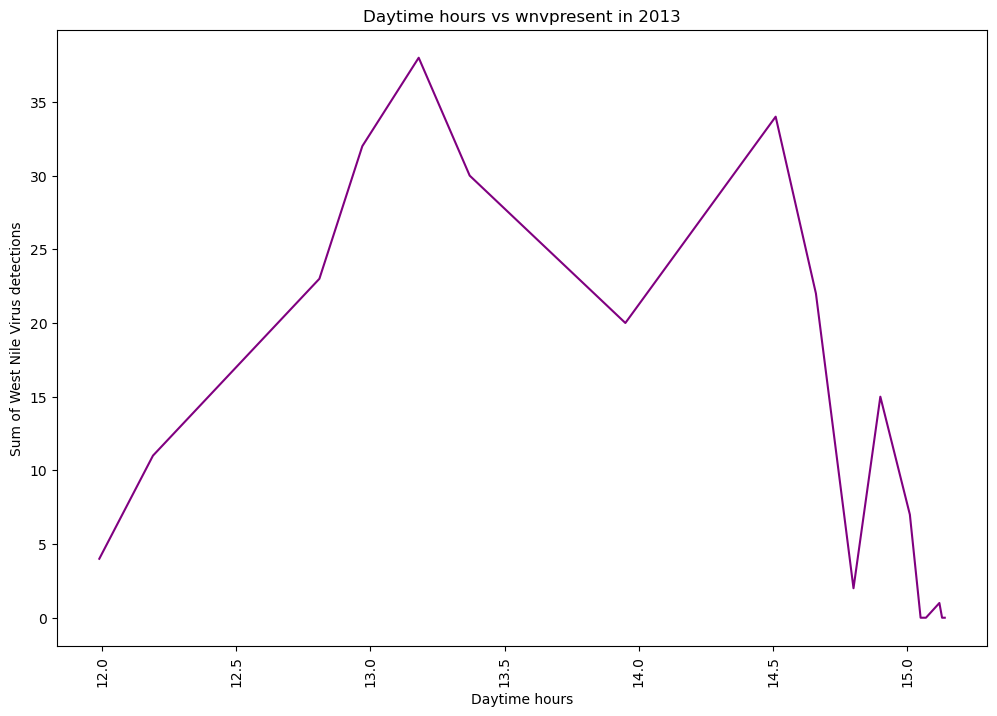

In [295]:
train_df_cleaned['daytime_hours'] = train_df_cleaned['sunset_stn1'] - train_df_cleaned['sunrise_stn1']
train_df_cleaned['daytime_hours'] = train_df_cleaned['daytime_hours'].apply(lambda x: x /100)
for x in train_df_cleaned['year'].unique():
    plt.figure(figsize=(12,8))
    train_df_cleaned[train_df_cleaned['year']==x].groupby(['daytime_hours'])['wnvpresent'].sum().plot.line(color='purple') 
    plt.title(f'Daytime hours vs wnvpresent in {x}')
    plt.xlabel('Daytime hours')
    plt.xticks(rotation=90)
    plt.ylabel('Sum of West Nile Virus detections')

Based on the above 4 line plots, generally there appears to be more occurence of West Nile Virus presence as the amount of day time goes higher than 13 hours, before going lower towards 15 hours

## 9. Check precipitation vs West Nile Virus Presence

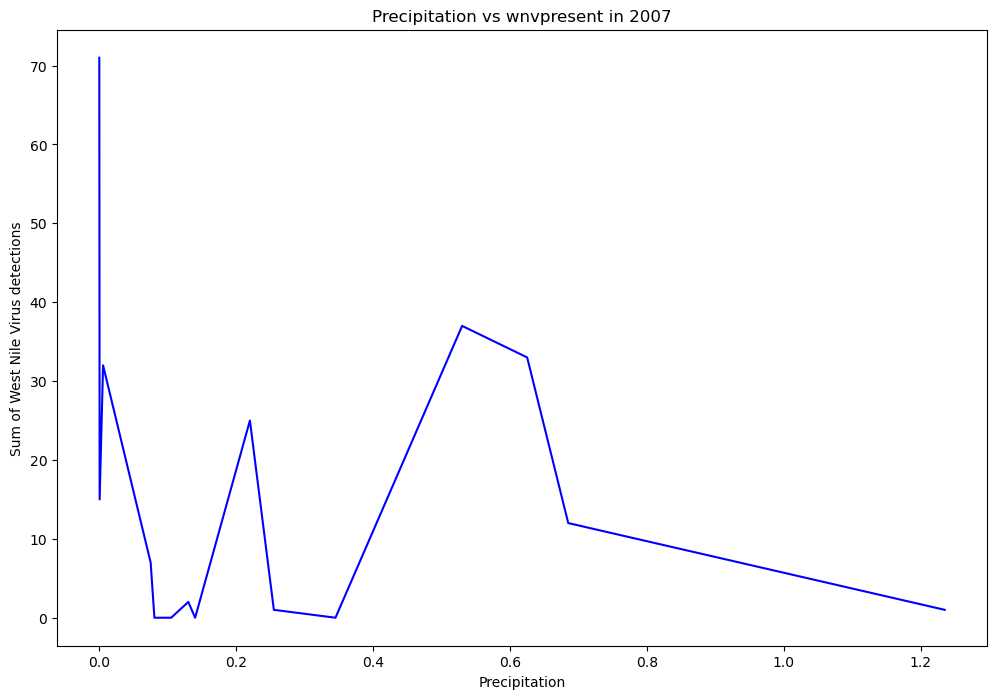

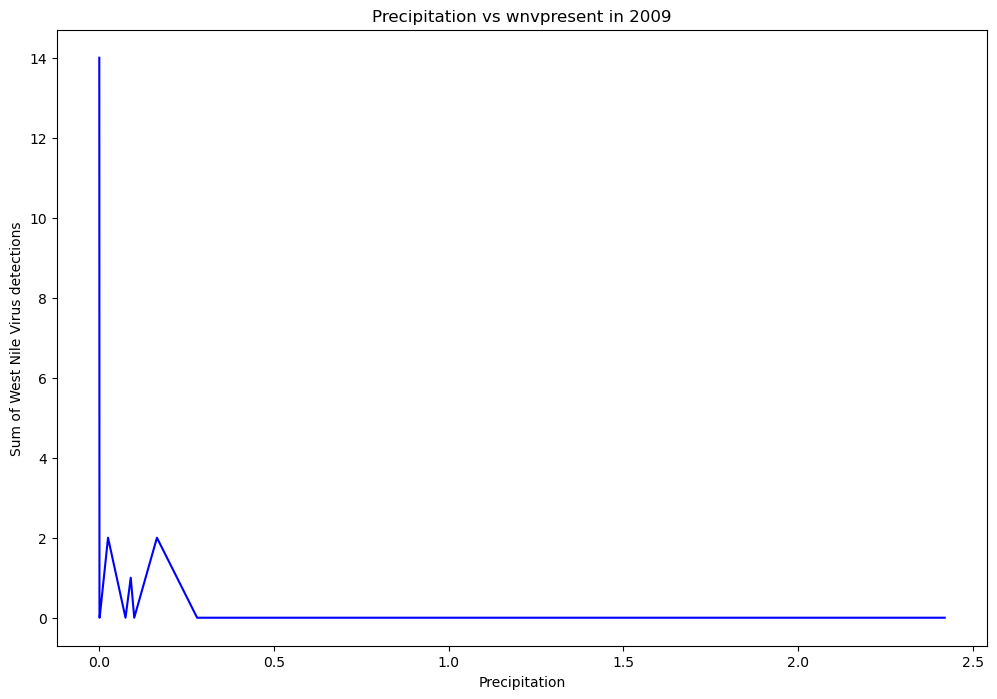

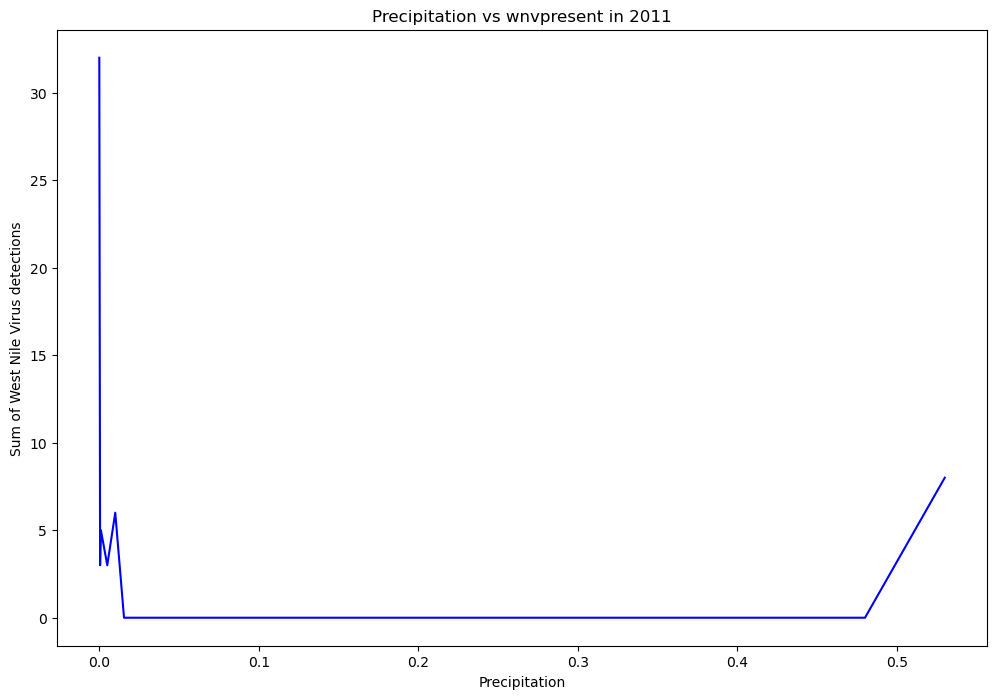

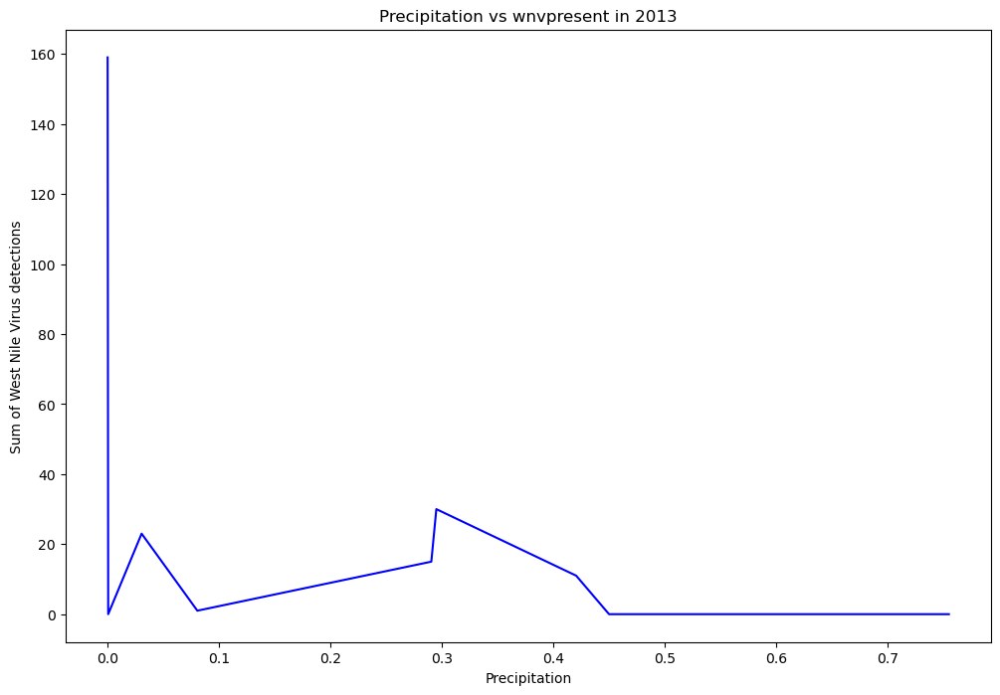

In [296]:
train_df_cleaned['preciptotal_avg'] = (train_df_cleaned['preciptotal_stn1'] + train_df_cleaned['preciptotal_stn2'])/2
for x in train_df_cleaned['year'].unique():
    plt.figure(figsize=(12,8))
    train_df_cleaned[train_df_cleaned['year']==x].groupby(['preciptotal_avg'])['wnvpresent'].sum().plot.line(color='blue') 
    plt.title(f'Precipitation vs wnvpresent in {x}')
    plt.xlabel('Precipitation')
    #plt.xticks(rotation=90)
    plt.ylabel('Sum of West Nile Virus detections')

Precipitation does not appear to affect occurrence of West Nile Virus presence on the same day

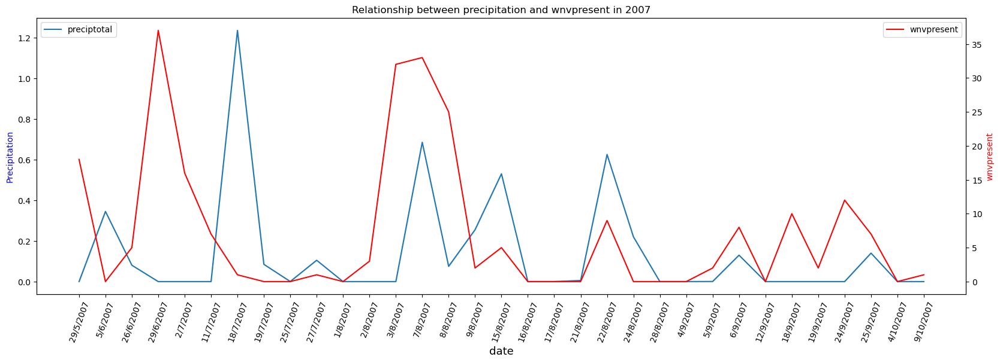

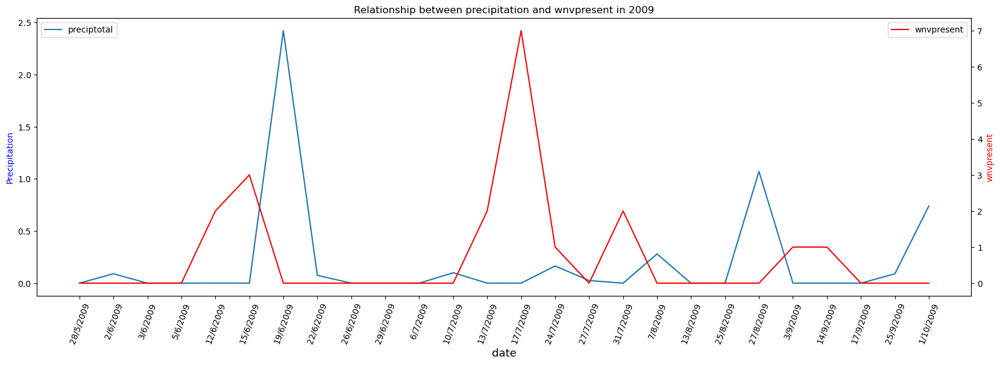

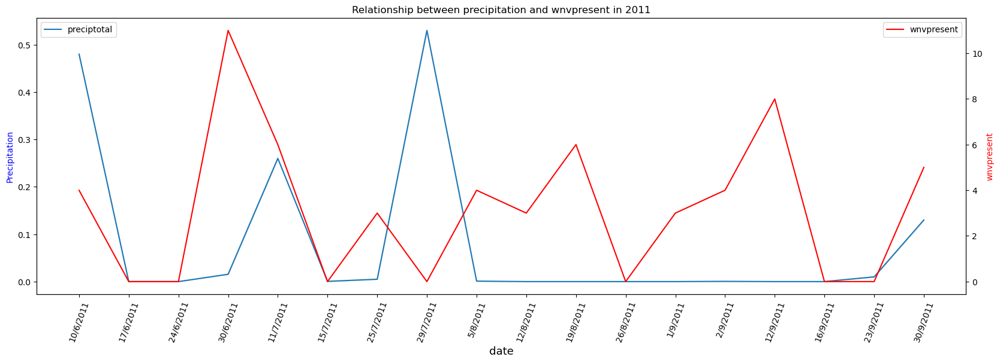

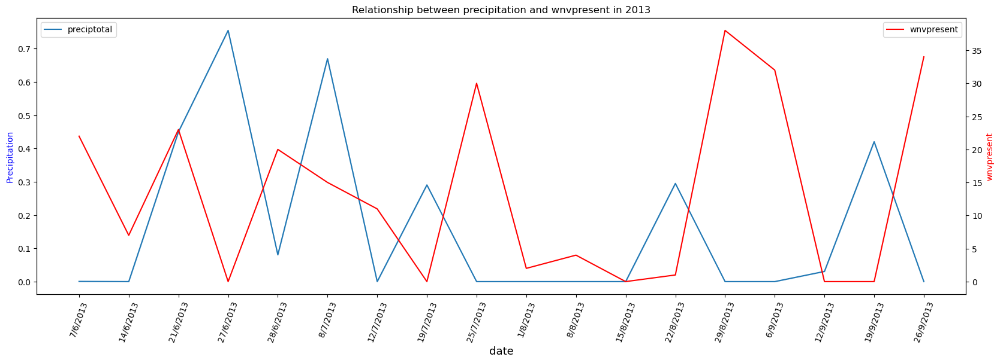

In [297]:
for x in train_df_cleaned['year'].unique():
    fig, ax1 = plt.subplots(figsize=(20,6))
    sns.lineplot(x=train_df_cleaned[train_df_cleaned['year']==x]['date'], y=train_df_cleaned[train_df_cleaned['year']==x]['preciptotal_avg'], label='preciptotal', ax=ax1)

    ax1.set_xlabel('date', fontsize=13)
    ax1.set_ylabel('Precipitation', color='b')
    ax1.legend(loc=2)
    ax1.set_xticklabels(ax1.get_xticklabels(), rotation=70);


    groupby = train_df_cleaned[train_df_cleaned['year']==x].groupby(['date'])['wnvpresent'].sum()
    df_new = pd.DataFrame(groupby)

    ax2 = ax1.twinx()
    sns.lineplot(x=df_new.index, y=df_new['wnvpresent'], color='r', label='wnvpresent', ax=ax2)
    ax2.set_ylabel('wnvpresent', color='r')
    ax2.legend(loc=1)

    plt.title(f'Relationship between precipitation and wnvpresent in {x}')

From the above 4 line plots, generally for time periods from the start of July, there appears to be a rise in the presence of West Nile Virus about 1-2 weeks after a period of rainfall. This may be due to mosquitoes breeding at water bodies left behind after rainfall, where eggs will generally develop into adult mosquitoes in 1-2 weeks which will then be infecting humans and transmitting the virus.

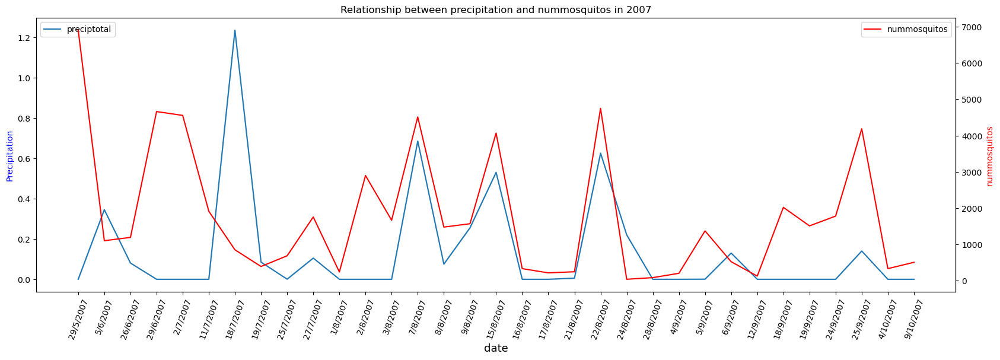

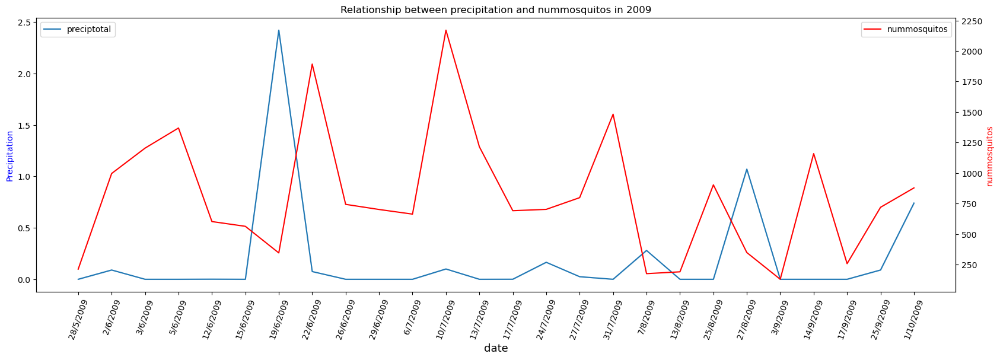

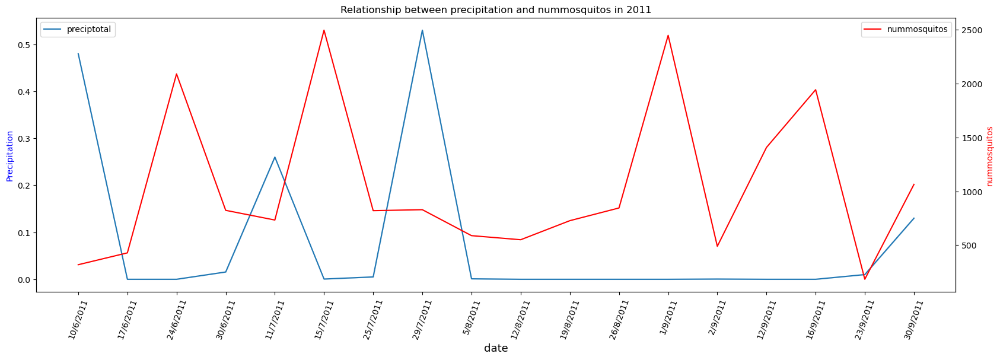

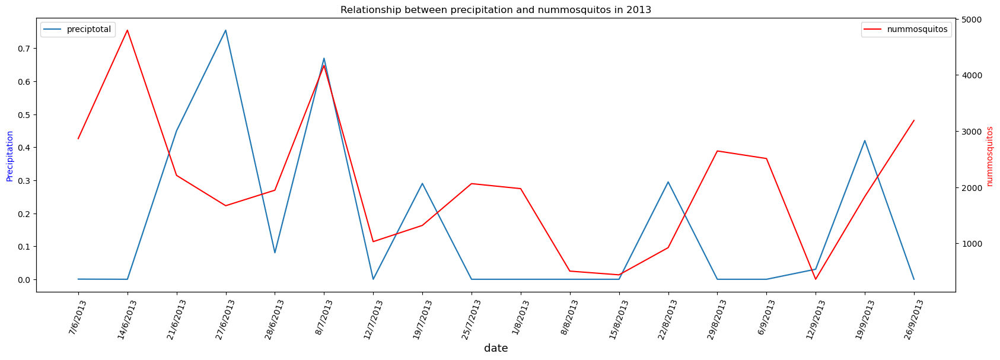

In [298]:
for x in train_df_cleaned['year'].unique():
    fig, ax1 = plt.subplots(figsize=(20,6))
    sns.lineplot(x=train_df_cleaned[train_df_cleaned['year']==x]['date'], y=train_df_cleaned[train_df_cleaned['year']==x]['preciptotal_avg'], label='preciptotal', ax=ax1)

    ax1.set_xlabel('date', fontsize=13)
    ax1.set_ylabel('Precipitation', color='b')
    ax1.legend(loc=2)
    ax1.set_xticklabels(ax1.get_xticklabels(), rotation=70);


    groupby = train_df_cleaned[train_df_cleaned['year']==x].groupby(['date'])['nummosquitos'].sum()
    df_new = pd.DataFrame(groupby)

    ax2 = ax1.twinx()
    sns.lineplot(x=df_new.index, y=df_new['nummosquitos'], color='r', label='nummosquitos', ax=ax2)
    ax2.set_ylabel('nummosquitos', color='r')
    ax2.legend(loc=1)

    plt.title(f'Relationship between precipitation and nummosquitos in {x}')

## 10. Check station pressure vs West Nile Virus Presence

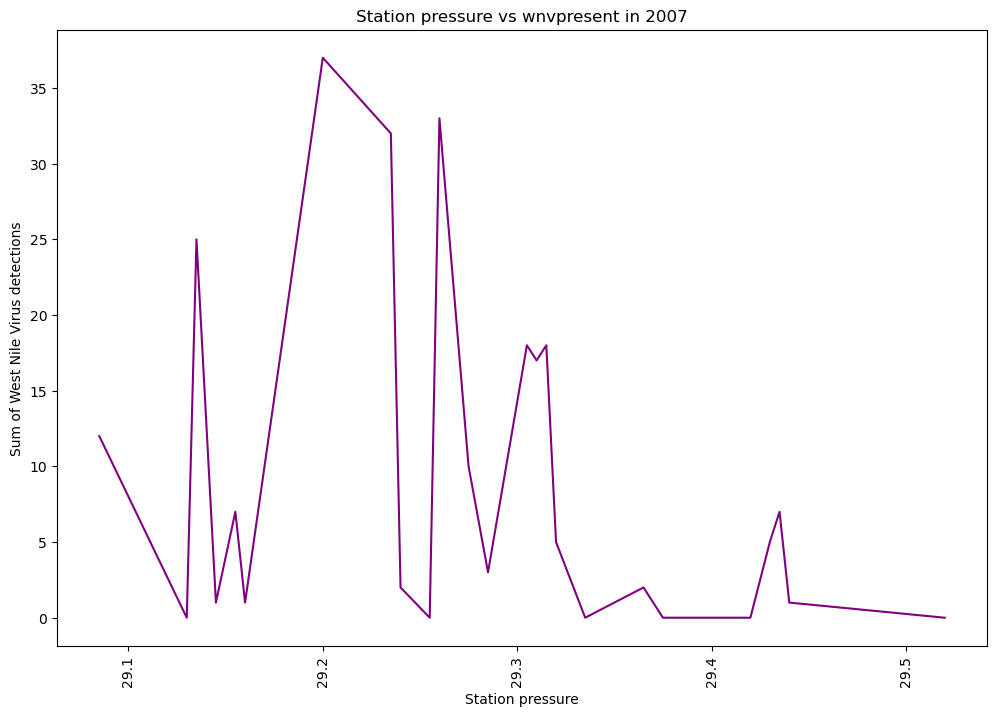

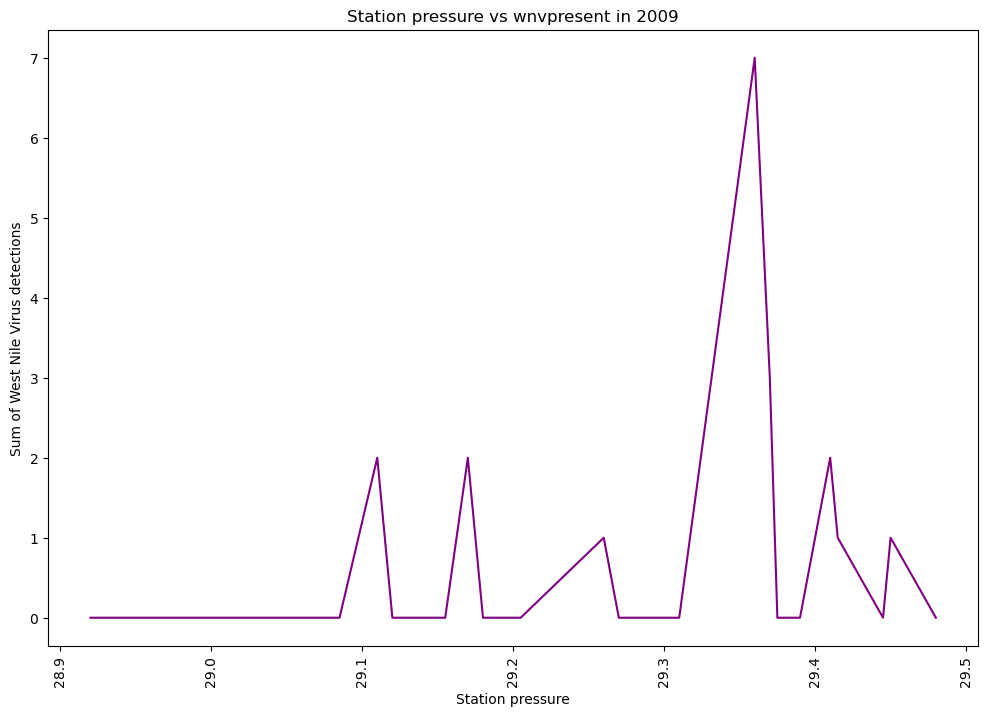

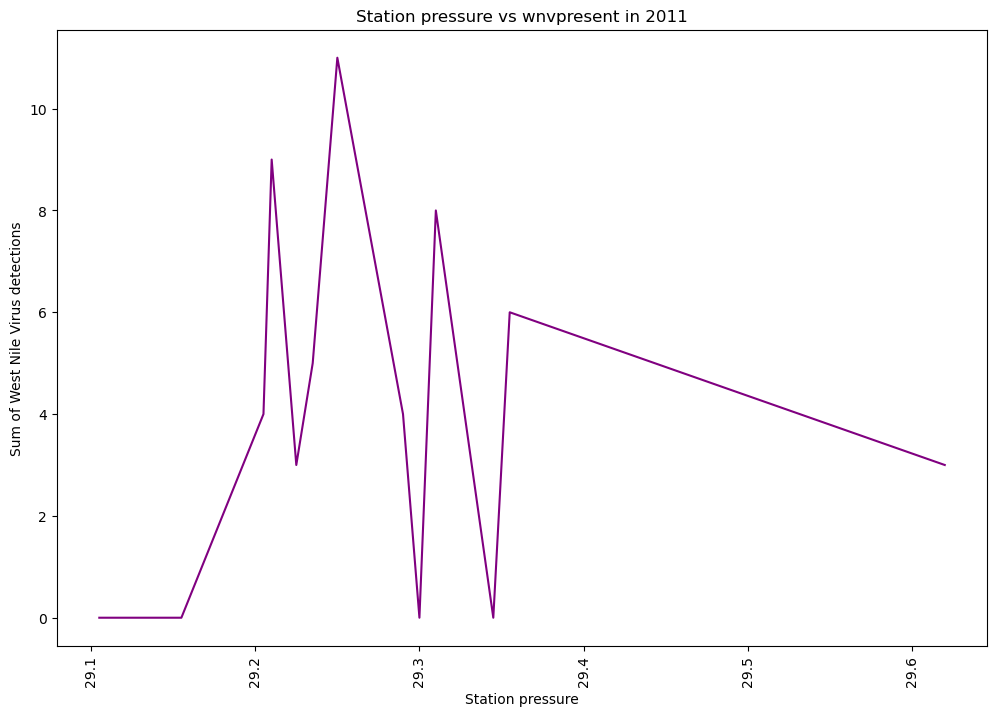

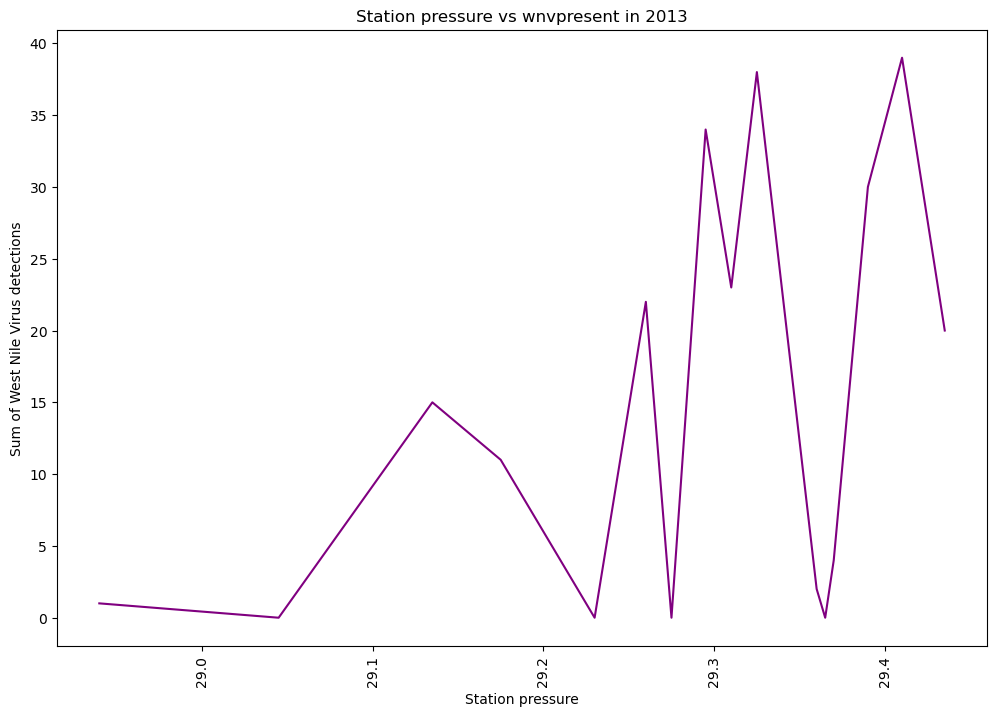

In [299]:
train_df_cleaned['stnpressure_avg'] = (train_df_cleaned['stnpressure_stn1'] + train_df_cleaned['stnpressure_stn2'])/2
for x in train_df_cleaned['year'].unique():
    plt.figure(figsize=(12,8))
    train_df_cleaned[train_df_cleaned['year']==x].groupby(['stnpressure_avg'])['wnvpresent'].sum().plot.line(color='purple') 
    plt.title(f'Station pressure vs wnvpresent in {x}')
    plt.xlabel('Station pressure')
    plt.xticks(rotation=90)
    plt.ylabel('Sum of West Nile Virus detections')

Based on the 4 line plots above, there is likely no insights that can be obtained from station pressure.

## 11. Check sea level pressure vs West Nile Virus Presence

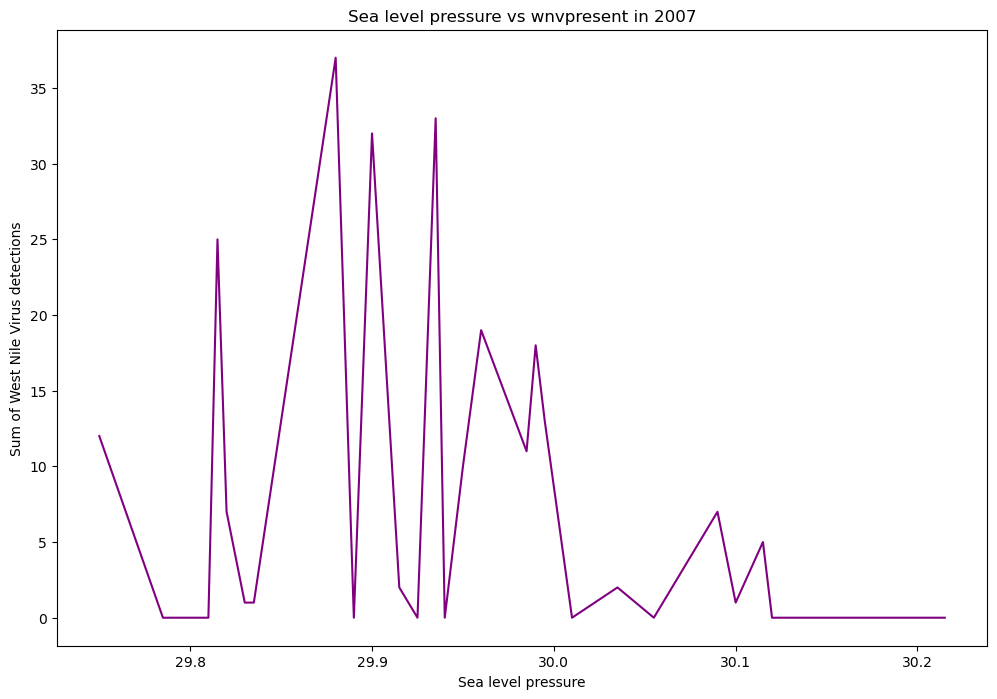

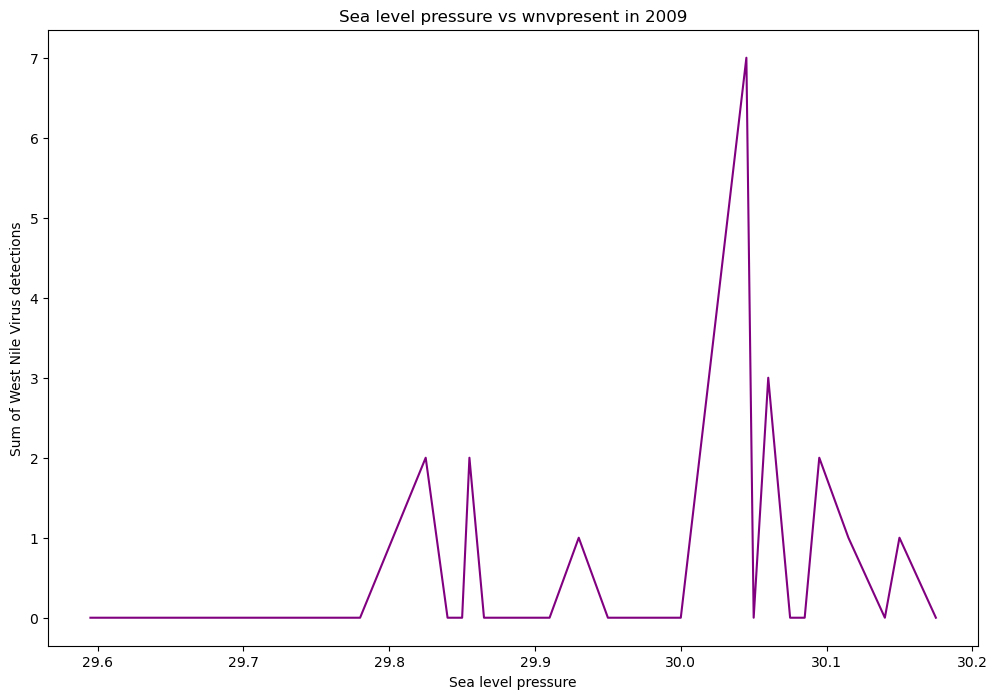

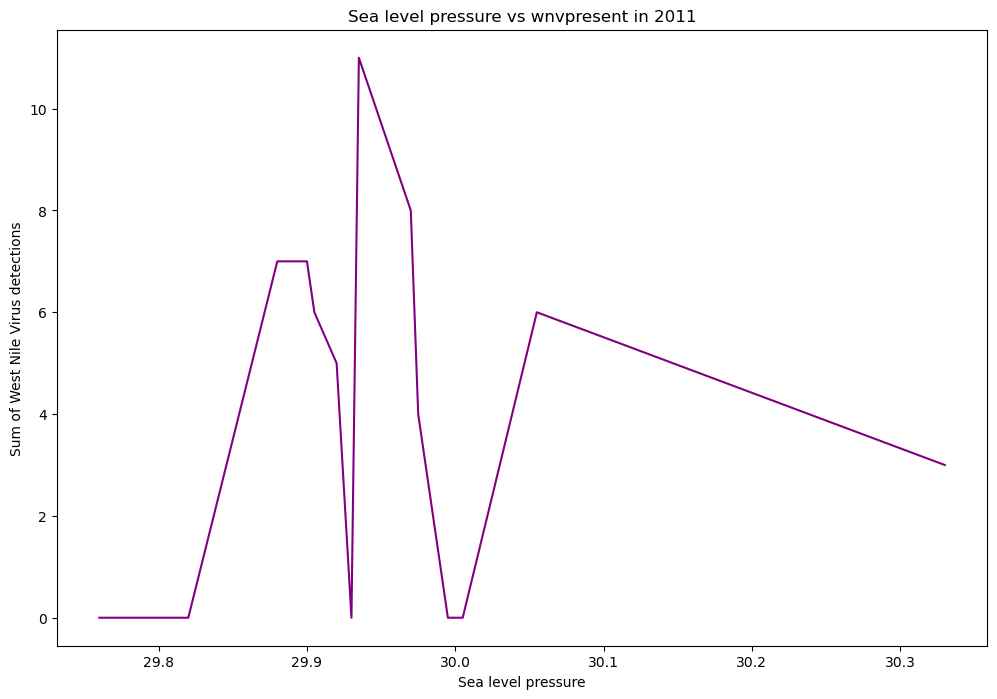

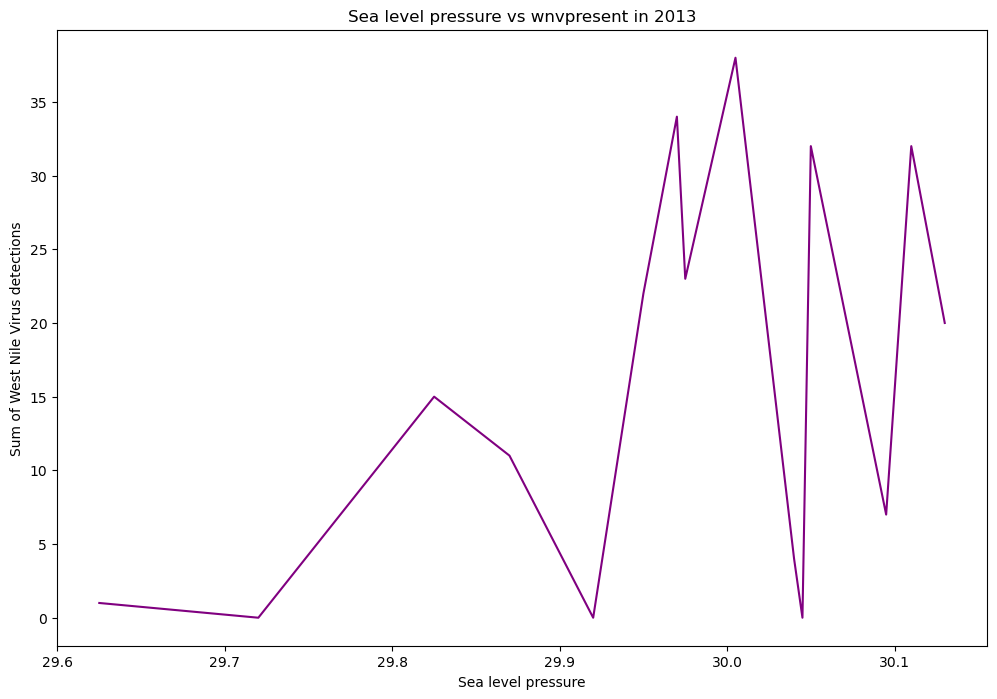

In [300]:
train_df_cleaned['sealevel_avg'] = (train_df_cleaned['sealevel_stn1'] + train_df_cleaned['sealevel_stn2'])/2
for x in train_df_cleaned['year'].unique():
    plt.figure(figsize=(12,8))
    train_df_cleaned[train_df_cleaned['year']==x].groupby(['sealevel_avg'])['wnvpresent'].sum().plot.line(color='purple') 
    plt.title(f'Sea level pressure vs wnvpresent in {x}')
    plt.xlabel('Sea level pressure')
    plt.ylabel('Sum of West Nile Virus detections')

Based on the 4 line plots above, there is likely no insights that can be obtained from sea level pressure.

## 12. Check average wind speed vs West Nile Virus Presence

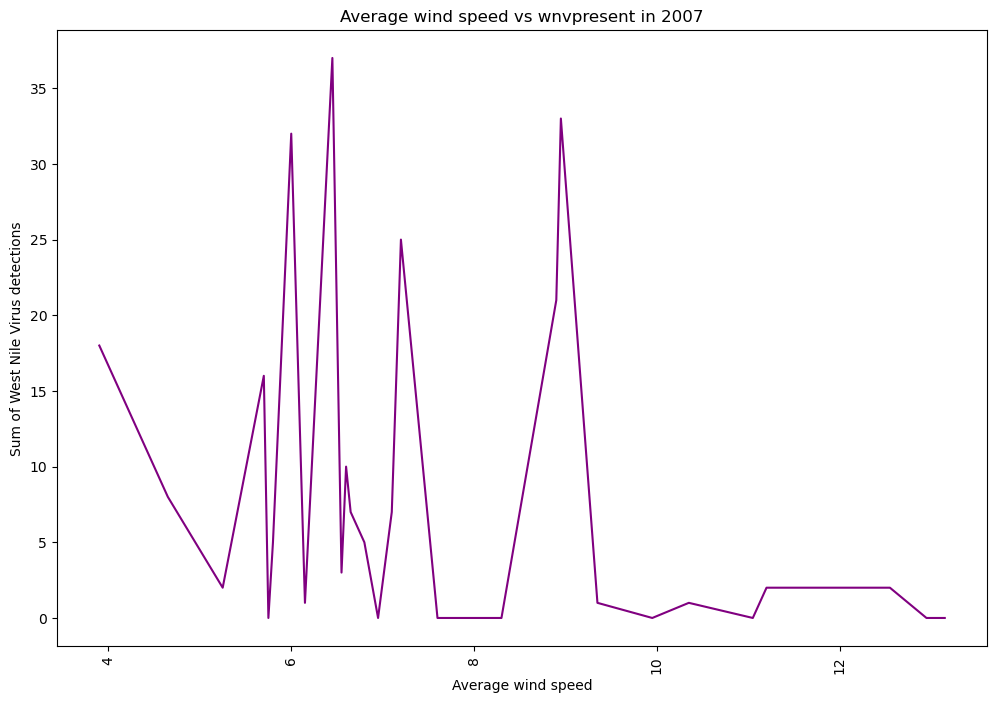

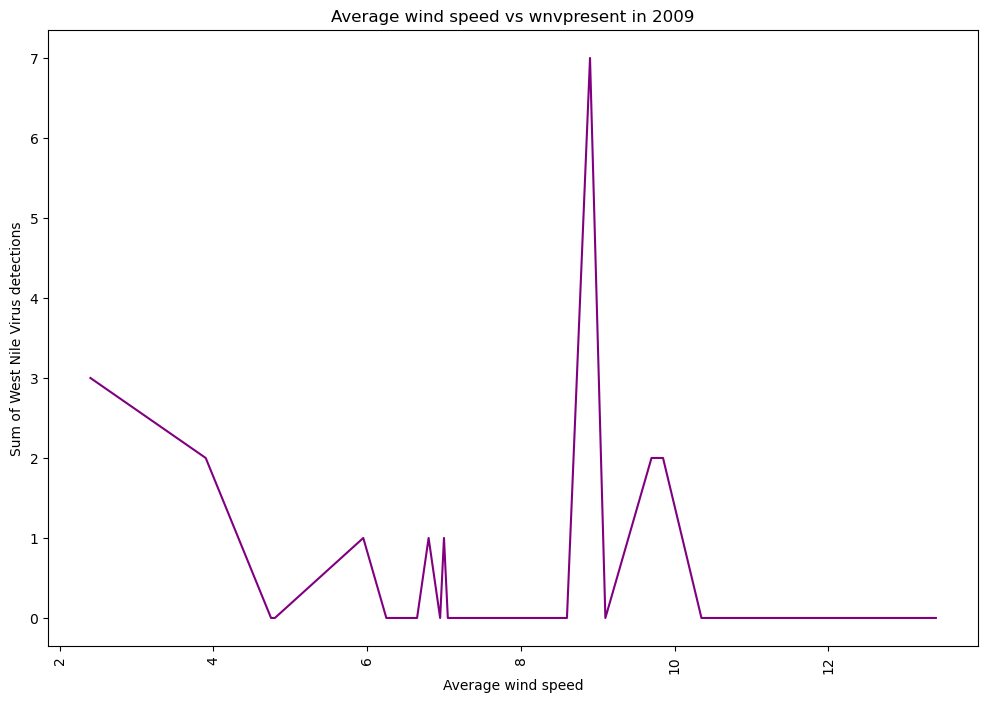

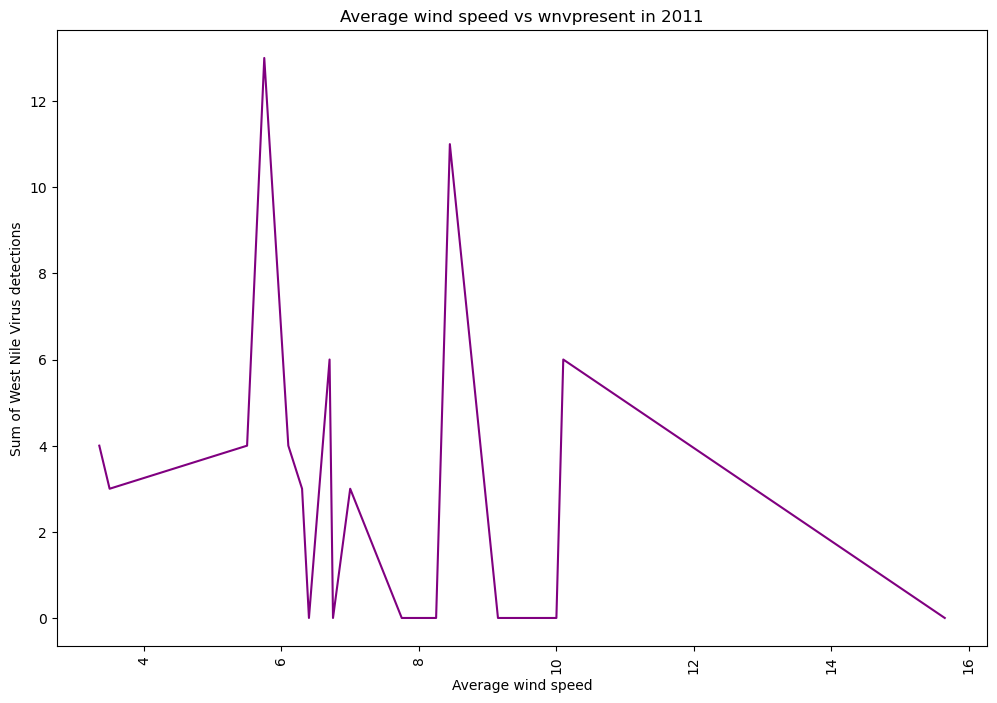

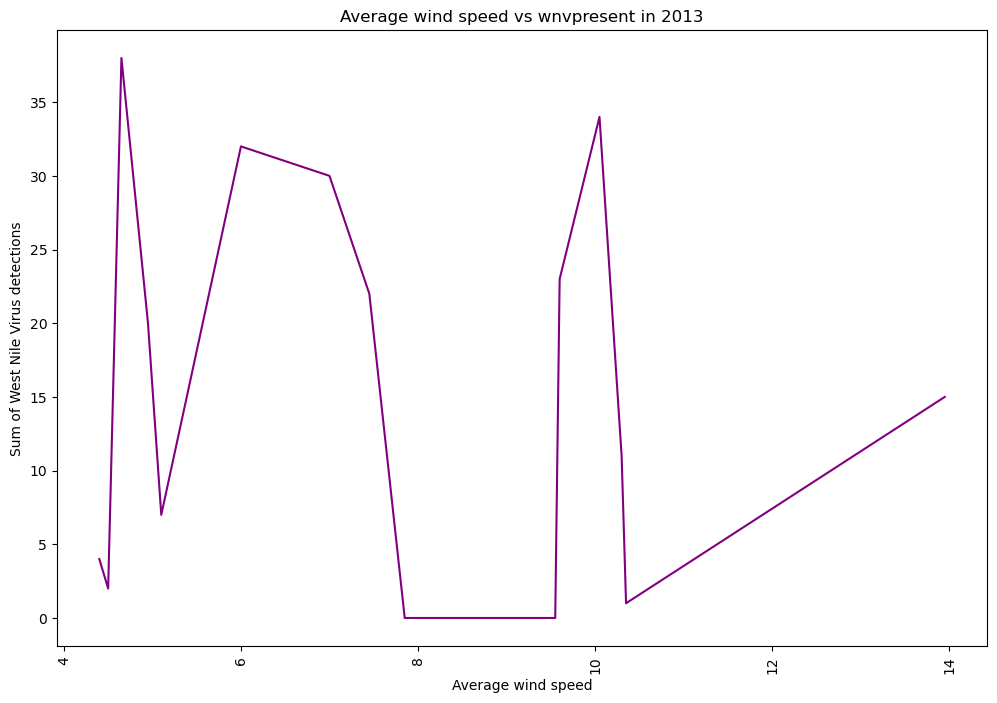

In [301]:
train_df_cleaned['avgspeed_avg'] = (train_df_cleaned['avgspeed_stn1'] + train_df_cleaned['avgspeed_stn2'])/2
for x in train_df_cleaned['year'].unique():
    plt.figure(figsize=(12,8))
    train_df_cleaned[train_df_cleaned['year']==x].groupby(['avgspeed_avg'])['wnvpresent'].sum().plot.line(color='purple') 
    plt.title(f'Average wind speed vs wnvpresent in {x}')
    plt.xlabel('Average wind speed')
    plt.xticks(rotation=90)
    plt.ylabel('Sum of West Nile Virus detections')

Based on the 4 line plots above, there is likely no insights that can be obtained from average wind speed.

## Summarizing Weather Conditions Across the Years

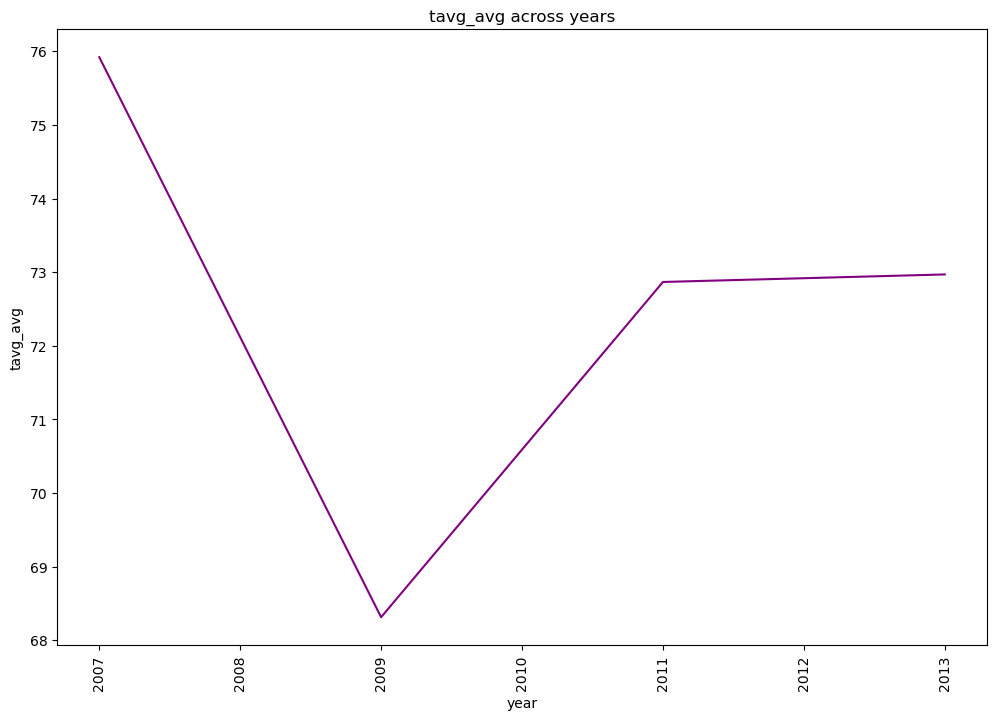

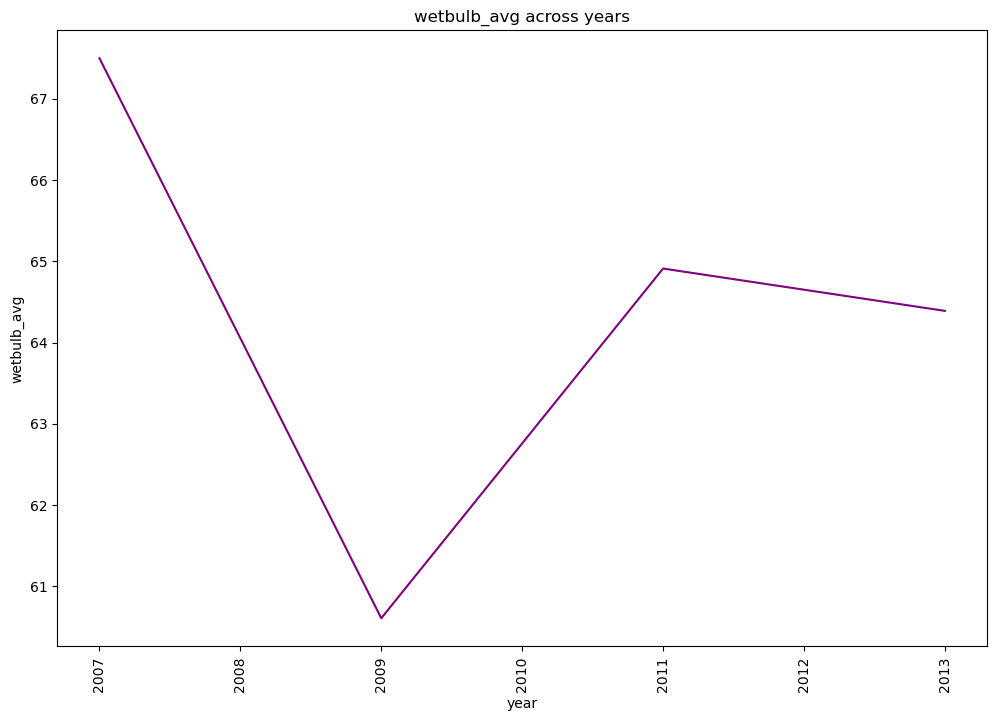

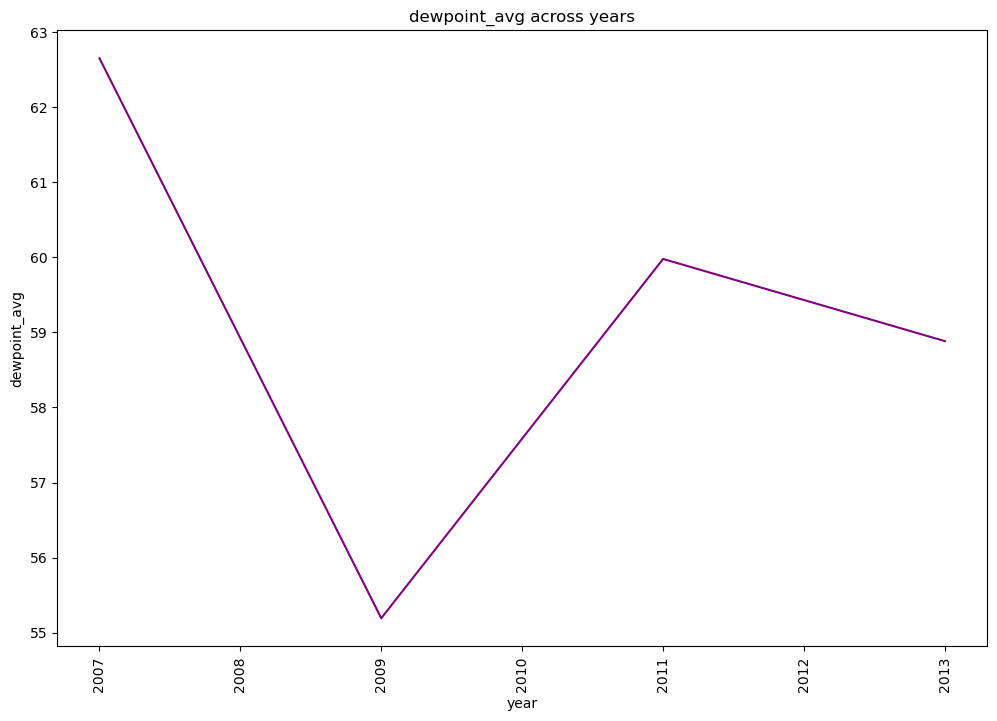

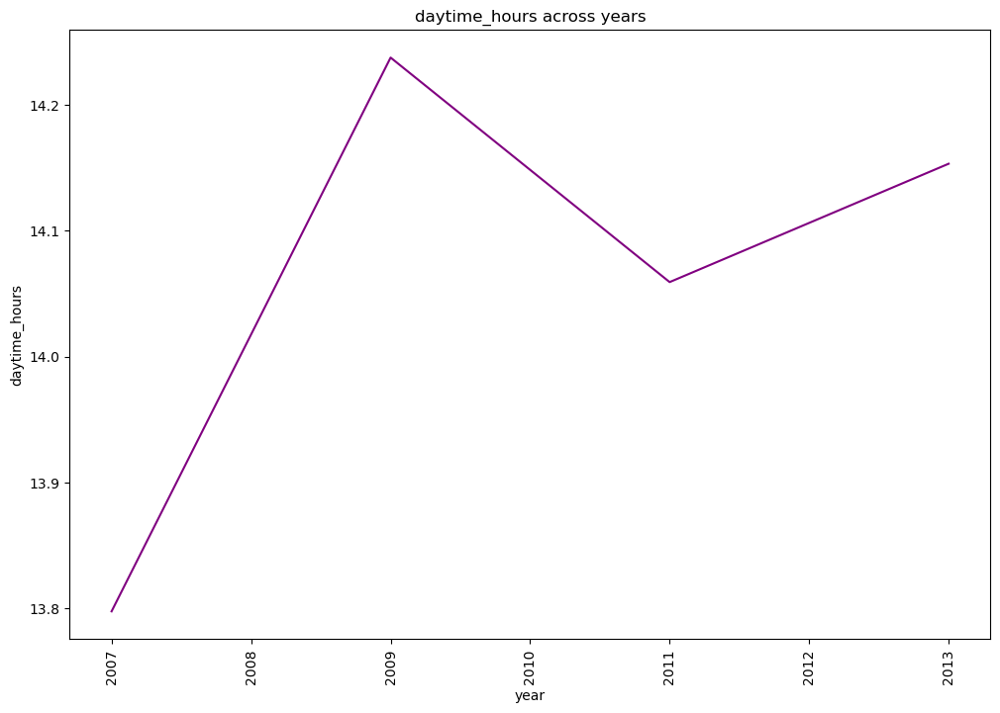

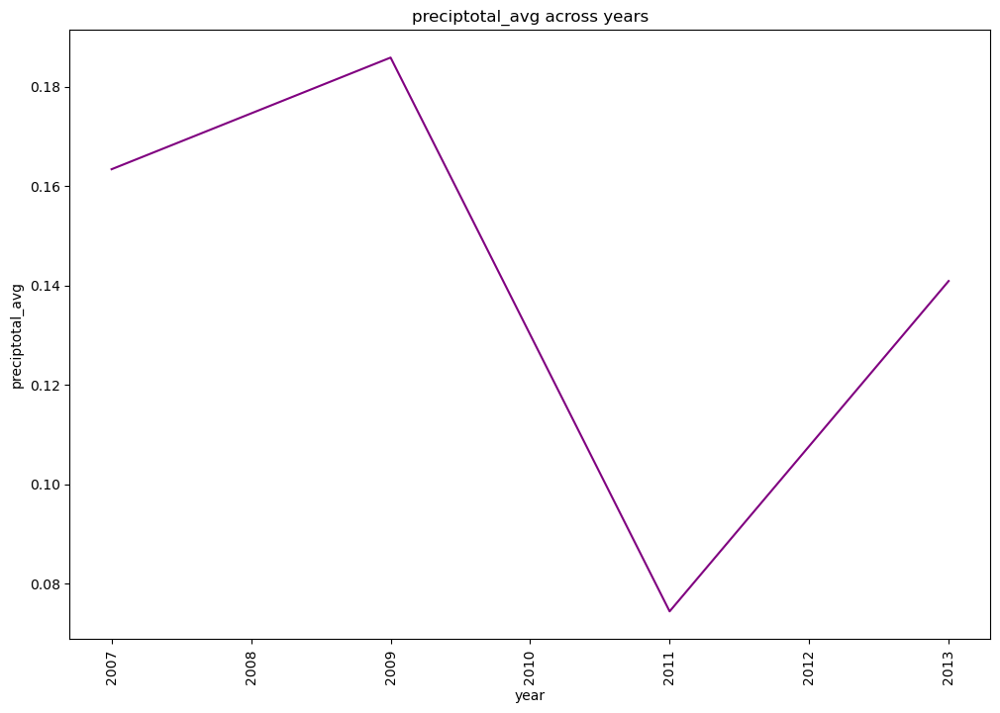

In [302]:
for parameter in ['tavg_avg', 'wetbulb_avg', 'dewpoint_avg', 'daytime_hours', 'preciptotal_avg']:
    plt.figure(figsize=(12,8))
    train_df_cleaned.groupby(['year'])[parameter].mean().plot.line(color='purple') 
    plt.title(f'{parameter} across years')
    plt.xlabel('year')
    plt.xticks(rotation=90)
    plt.ylabel(f'{parameter}')

2009 has the lowest average average temperature, average wetbulb temperature and average dewpoint. 2009 also has the highest daytime hours and average precipitation.

## 13. Using geographic data to visualise the locations of West Nile Virus density

Below we will show the density of West Nile Virus presence hotspots with traps location overlay for:
1. 2007, 2009, 2011, 2013
2. 2007 only
3. 2009 only

In [303]:
from sklearn.neighbors import KernelDensity

mapdata = np.loadtxt("../Kaggle Datasets/mapdata_copyright_openstreetmap_contributors.txt/mapdata_copyright_openstreetmap_contributors.txt")
traps = pd.read_csv('../cleaned_dataset/train_with_species.csv')[['date', 'trap','longitude', 'latitude', 'wnvpresent']]
sprays =  pd.read_csv('../cleaned_dataset/spray.csv')[['date', 'time', 'longitude', 'latitude']]


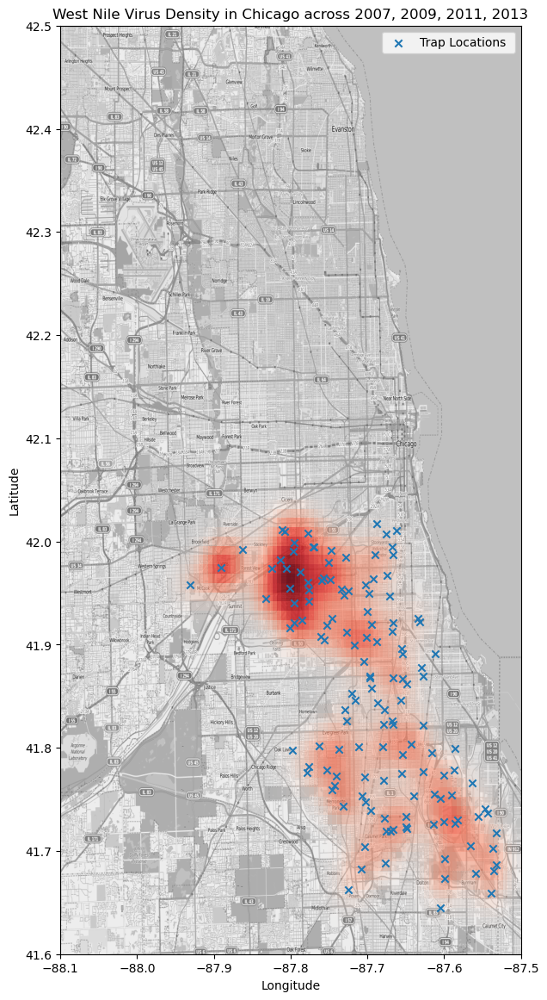

In [304]:
alpha_cm = plt.cm.Reds
alpha_cm._init()
alpha_cm._lut[:-3,-1] = abs(np.logspace(0, 1, alpha_cm.N) / 10 - 1)[::-1]
aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88.1, -87.5, 41.6, 42.5)

sightings = traps[traps['wnvpresent'] > 0]
sightings = sightings.groupby(['date', 'trap','longitude', 'latitude']).max()['wnvpresent'].reset_index()
X = sightings[['longitude', 'latitude']].values
kd = KernelDensity(bandwidth=0.02)
kd.fit(X)

xv,yv = np.meshgrid(np.linspace(-88.1, -87.5, 100), np.linspace(41.6, 42.5, 100))
gridpoints = np.array([xv.ravel(),yv.ravel()]).T
zv = np.exp(kd.score_samples(gridpoints).reshape(100,100))
plt.figure(figsize=(10,14))
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)
plt.imshow(zv, 
           origin='lower', 
           cmap=alpha_cm, 
           extent=lon_lat_box, 
           aspect=aspect)

locations = traps[['longitude', 'latitude']].drop_duplicates().values
plt.scatter(locations[:,0], locations[:,1], marker='x', label='Trap Locations ')

plt.title('West Nile Virus Density in Chicago across 2007, 2009, 2011, 2013')
plt.legend()
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.savefig('../heatmap/heatmap_2007_2009_2011_2013.png')

The darker red regions indicate a higher density of West Nile Virus. The dense region is approximately at latitude and longitude 41.95, -87.8.

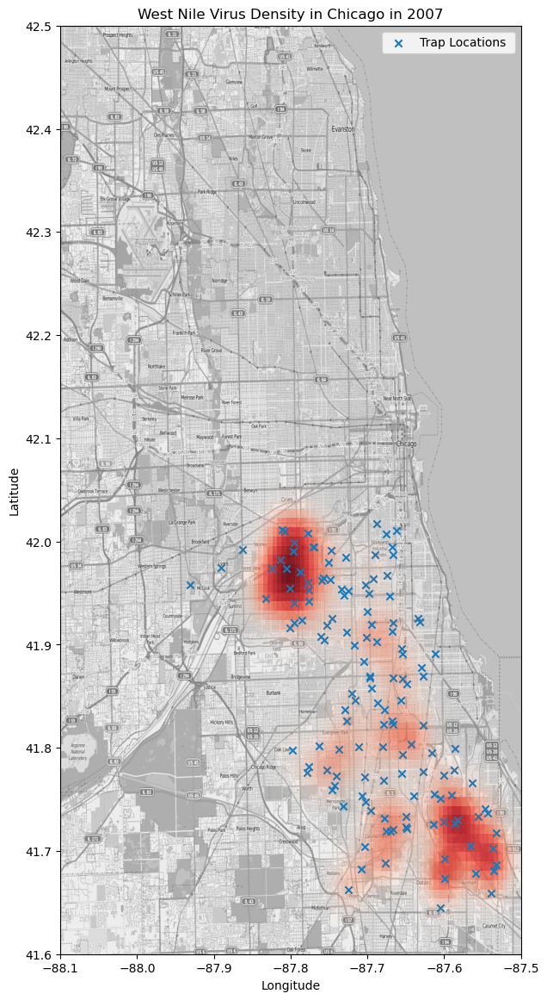

In [305]:
# Filtering for only 2007, with traps location overlay only
traps2007['date'] = pd.to_datetime(traps['date'])
traps2007_filtered = traps2007[traps2007['date'].dt.year.isin([2007])]


alpha_cm = plt.cm.Reds
alpha_cm._init()
alpha_cm._lut[:-3,-1] = abs(np.logspace(0, 1, alpha_cm.N) / 10 - 1)[::-1]
aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88.1, -87.5, 41.6, 42.5)

sightings2007 = traps2007_filtered[traps2007_filtered['wnvpresent'] > 0]
sightings2007 = sightings2007.groupby(['date', 'trap','longitude', 'latitude']).max()['wnvpresent'].reset_index()
X2007 = sightings2007[['longitude', 'latitude']].values
kd2007 = KernelDensity(bandwidth=0.02)
kd2007.fit(X2007)

xv,yv = np.meshgrid(np.linspace(-88.1, -87.5, 100), np.linspace(41.6, 42.5, 100))
gridpoints = np.array([xv.ravel(),yv.ravel()]).T
zv = np.exp(kd2007.score_samples(gridpoints).reshape(100,100))
plt.figure(figsize=(10,14))
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)
plt.imshow(zv, 
           origin='lower', 
           cmap=alpha_cm, 
           extent=lon_lat_box, 
           aspect=aspect)

locations = traps2007[['longitude', 'latitude']].drop_duplicates().values
plt.scatter(locations[:,0], locations[:,1], marker='x', label='Trap Locations ')

# spray_locations = sprays[['longitude', 'latitude']].drop_duplicates().values
# plt.scatter(locations[:,0], locations[:,1], marker='o', label='Spray Locations ')

plt.title('West Nile Virus Density in Chicago in 2007')
plt.legend()
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.savefig('../heatmap/heatmap_2007_without_spray_marker_with_trap_marker.png')

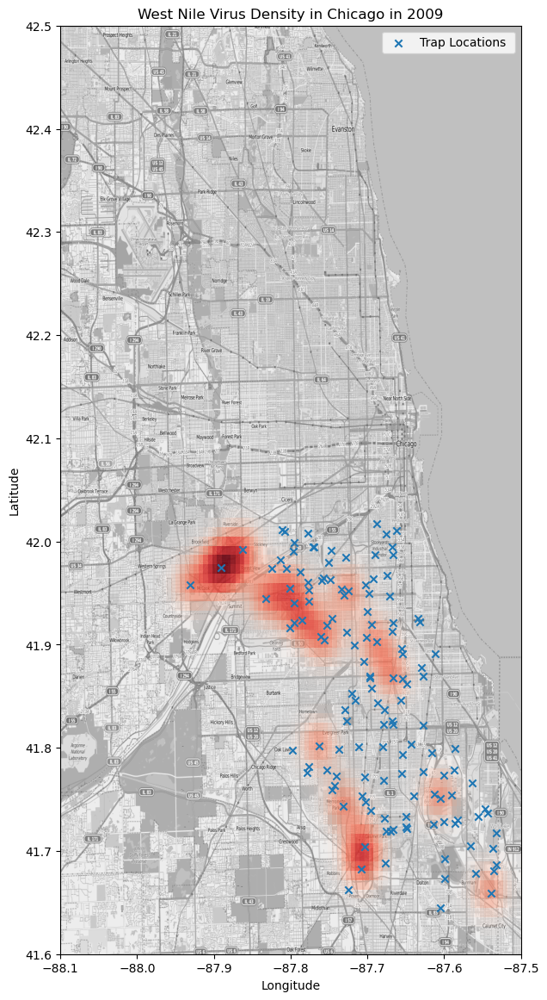

In [306]:
# Filtering for only 2009, with traps location overlay only
traps2009['date'] = pd.to_datetime(traps['date'])
traps2009_filtered = traps2009[traps2009['date'].dt.year.isin([2009])]

alpha_cm = plt.cm.Reds
alpha_cm._init()
alpha_cm._lut[:-3,-1] = abs(np.logspace(0, 1, alpha_cm.N) / 10 - 1)[::-1]
aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88.1, -87.5, 41.6, 42.5)

sightings2009 = traps2009_filtered[traps2009_filtered['wnvpresent'] > 0]
sightings2009 = sightings2009.groupby(['date', 'trap','longitude', 'latitude']).max()['wnvpresent'].reset_index()
X2009 = sightings2009[['longitude', 'latitude']].values
kd2009 = KernelDensity(bandwidth=0.02)
kd2009.fit(X2009)

xv,yv = np.meshgrid(np.linspace(-88.1, -87.5, 100), np.linspace(41.6, 42.5, 100))
gridpoints = np.array([xv.ravel(),yv.ravel()]).T
zv = np.exp(kd2009.score_samples(gridpoints).reshape(100,100))
plt.figure(figsize=(10,14))
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)
plt.imshow(zv, 
           origin='lower', 
           cmap=alpha_cm, 
           extent=lon_lat_box, 
           aspect=aspect)

locations = traps2009[['longitude', 'latitude']].drop_duplicates().values
plt.scatter(locations[:,0], locations[:,1], marker='x', label='Trap Locations ')

# spray_locations = sprays[['longitude', 'latitude']].drop_duplicates().values
# plt.scatter(locations[:,0], locations[:,1], marker='o', label='Spray Locations ')

plt.title('West Nile Virus Density in Chicago in 2009')
plt.legend()
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.savefig('../heatmap/heatmap_2009_without_spray_marker_with_trap_marker.png')

## 14. Checking possible effects of spraying

Below we will show the density of West Nile Virus hotspots for 2011 and 2013, one map with traps location overlay, and another map with spray location overlay

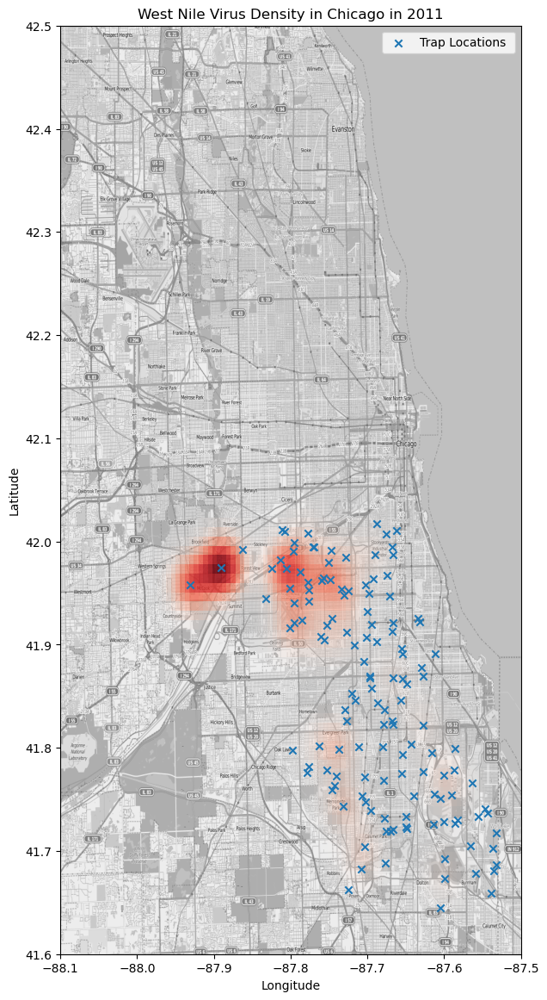

In [307]:
# Filtering for only 2011, with traps location overlay only
traps2011 = traps
traps2011['date'] = pd.to_datetime(traps['date'])
traps2011_filtered = traps2011[traps2011['date'].dt.year.isin([2011])]


alpha_cm = plt.cm.Reds
alpha_cm._init()
alpha_cm._lut[:-3,-1] = abs(np.logspace(0, 1, alpha_cm.N) / 10 - 1)[::-1]
aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88.1, -87.5, 41.6, 42.5)

sightings2011 = traps2011_filtered[traps2011_filtered['wnvpresent'] > 0]
sightings2011 = sightings2011.groupby(['date', 'trap','longitude', 'latitude']).max()['wnvpresent'].reset_index()
X2011 = sightings2011[['longitude', 'latitude']].values
kd2011 = KernelDensity(bandwidth=0.02)
kd2011.fit(X2011)

xv,yv = np.meshgrid(np.linspace(-88.1, -87.5, 100), np.linspace(41.6, 42.5, 100))
gridpoints = np.array([xv.ravel(),yv.ravel()]).T
zv = np.exp(kd2011.score_samples(gridpoints).reshape(100,100))
plt.figure(figsize=(10,14))
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)
plt.imshow(zv, 
           origin='lower', 
           cmap=alpha_cm, 
           extent=lon_lat_box, 
           aspect=aspect)

locations = traps2011[['longitude', 'latitude']].drop_duplicates().values
plt.scatter(locations[:,0], locations[:,1], marker='x', label='Trap Locations ')

# spray_locations = sprays[['longitude', 'latitude']].drop_duplicates().values
# plt.scatter(locations[:,0], locations[:,1], marker='o', label='Spray Locations ')

plt.title('West Nile Virus Density in Chicago in 2011')
plt.legend()
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.savefig('../heatmap/heatmap_2011_without_spray_marker_with_trap_marker.png')

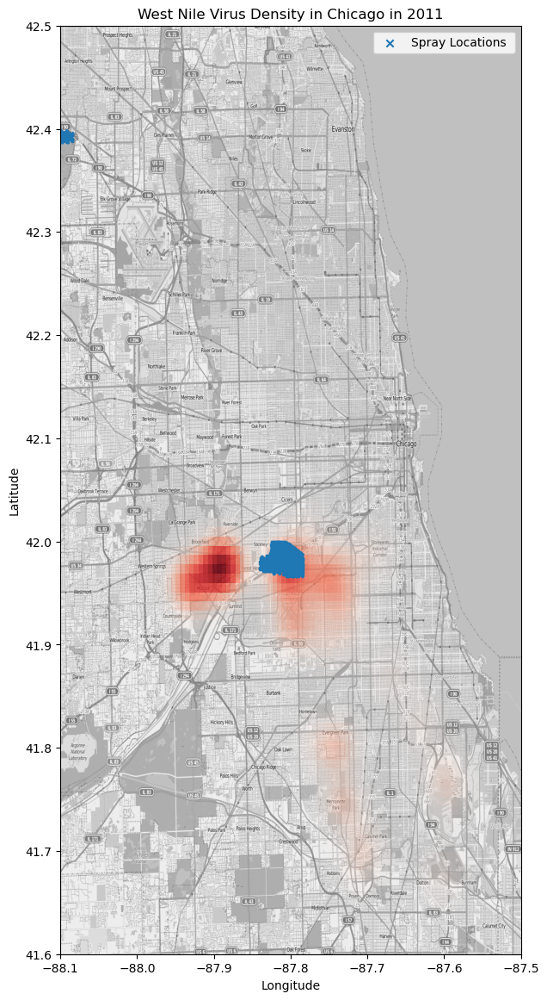

In [308]:
# Filtering for only 2011 with spray location overlay only

traps2011s = traps
traps2011s['date'] = pd.to_datetime(traps2011s['date'])
traps2011s_filtered = traps2011s[traps2011s['date'].dt.year.isin([2011])]

sprays2011s =  sprays
sprays2011s['date'] = pd.to_datetime(sprays2011s['date'])
sprays2011s_filtered = sprays2011s[sprays2011s['date'].dt.year.isin([2011])]

alpha_cm = plt.cm.Reds
alpha_cm._init()
alpha_cm._lut[:-3,-1] = abs(np.logspace(0, 1, alpha_cm.N) / 10 - 1)[::-1]
aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88.1, -87.5, 41.6, 42.5)

sightings2011s = traps2011s_filtered[traps2011s_filtered['wnvpresent'] > 0]
sightings2011s = sightings2011s.groupby(['date', 'trap','longitude', 'latitude']).max()['wnvpresent'].reset_index()
X2011s = sightings2011s[['longitude', 'latitude']].values
kd2011s = KernelDensity(bandwidth=0.02)
kd2011s.fit(X2011s)

xv,yv = np.meshgrid(np.linspace(-88.1, -87.5, 100), np.linspace(41.6, 42.5, 100))
gridpoints = np.array([xv.ravel(),yv.ravel()]).T
zv = np.exp(kd2011s.score_samples(gridpoints).reshape(100,100))
plt.figure(figsize=(10,14))
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)
plt.imshow(zv, 
           origin='lower', 
           cmap=alpha_cm, 
           extent=lon_lat_box, 
           aspect=aspect)

locations = sprays2011s_filtered[['longitude', 'latitude']].drop_duplicates().values
plt.scatter(locations[:,0], locations[:,1], marker='x', label='Spray Locations ')

# spray_locations = sprays[['longitude', 'latitude']].drop_duplicates().values
# plt.scatter(locations[:,0], locations[:,1], marker='o', label='Spray Locations ')

plt.title('West Nile Virus Density in Chicago in 2011')
plt.legend()
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.savefig('../heatmap/heatmap_2011_with_spray_marker.png')

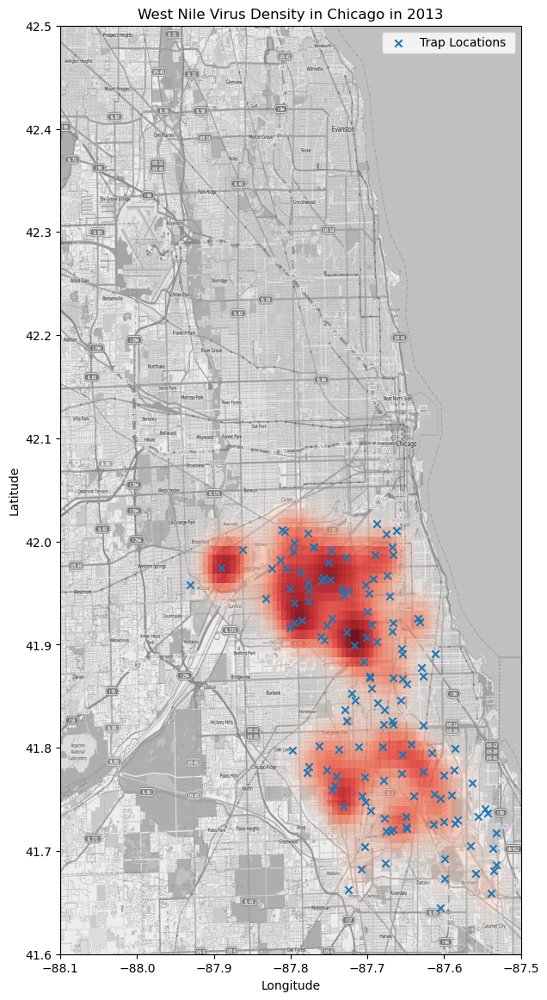

In [309]:
# Filtering for only 2013, with traps location overlay only
traps2013 = traps
traps2013['date'] = pd.to_datetime(traps2013['date'])
traps2013_filtered = traps2013[traps2013['date'].dt.year.isin([2013])]


alpha_cm = plt.cm.Reds
alpha_cm._init()
alpha_cm._lut[:-3,-1] = abs(np.logspace(0, 1, alpha_cm.N) / 10 - 1)[::-1]
aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88.1, -87.5, 41.6, 42.5)

sightings2013 = traps2013_filtered[traps2013_filtered['wnvpresent'] > 0]
sightings2013 = sightings2013.groupby(['date', 'trap','longitude', 'latitude']).max()['wnvpresent'].reset_index()
X2013 = sightings2013[['longitude', 'latitude']].values
kd2013 = KernelDensity(bandwidth=0.02)
kd2013.fit(X2013)

xv,yv = np.meshgrid(np.linspace(-88.1, -87.5, 100), np.linspace(41.6, 42.5, 100))
gridpoints = np.array([xv.ravel(),yv.ravel()]).T
zv = np.exp(kd2013.score_samples(gridpoints).reshape(100,100))
plt.figure(figsize=(10,14))
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)
plt.imshow(zv, 
           origin='lower', 
           cmap=alpha_cm, 
           extent=lon_lat_box, 
           aspect=aspect)

locations = traps2013[['longitude', 'latitude']].drop_duplicates().values
plt.scatter(locations[:,0], locations[:,1], marker='x', label='Trap Locations ')

# spray_locations = sprays[['longitude', 'latitude']].drop_duplicates().values
# plt.scatter(locations[:,0], locations[:,1], marker='o', label='Spray Locations ')

plt.title('West Nile Virus Density in Chicago in 2013')
plt.legend()
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.savefig('../heatmap/heatmap_2013_without_spray_marker_with_trap_marker.png')

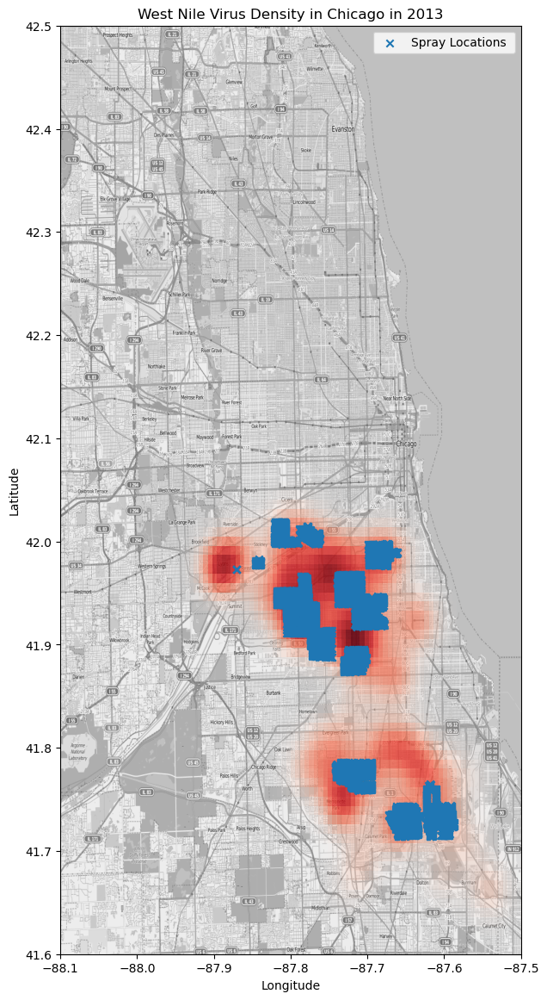

In [310]:
# Filtering for only 2013 with spray location overlay only

traps2013s = traps
traps2013s['date'] = pd.to_datetime(traps2013s['date'])
traps2013s_filtered = traps2013s[traps2013s['date'].dt.year.isin([2013])]

sprays2013s =  sprays
sprays2013s['date'] = pd.to_datetime(sprays2013s['date'])
sprays2013s_filtered = sprays2013s[sprays2013s['date'].dt.year.isin([2013])]

alpha_cm = plt.cm.Reds
alpha_cm._init()
alpha_cm._lut[:-3,-1] = abs(np.logspace(0, 1, alpha_cm.N) / 10 - 1)[::-1]
aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88.1, -87.5, 41.6, 42.5)

sightings2013s = traps2013s_filtered[traps2013s_filtered['wnvpresent'] > 0]
sightings2013s = sightings2013s.groupby(['date', 'trap','longitude', 'latitude']).max()['wnvpresent'].reset_index()
X2013s = sightings2013s[['longitude', 'latitude']].values
kd2013s = KernelDensity(bandwidth=0.02)
kd2013s.fit(X2013s)

xv,yv = np.meshgrid(np.linspace(-88.1, -87.5, 100), np.linspace(41.6, 42.5, 100))
gridpoints = np.array([xv.ravel(),yv.ravel()]).T
zv = np.exp(kd2013s.score_samples(gridpoints).reshape(100,100))
plt.figure(figsize=(10,14))
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)
plt.imshow(zv, 
           origin='lower', 
           cmap=alpha_cm, 
           extent=lon_lat_box, 
           aspect=aspect)

locations = sprays2013s_filtered[['longitude', 'latitude']].drop_duplicates().values
plt.scatter(locations[:,0], locations[:,1], marker='x', label='Spray Locations ')

# spray_locations = sprays[['longitude', 'latitude']].drop_duplicates().values
# plt.scatter(locations[:,0], locations[:,1], marker='o', label='Spray Locations ')

plt.title('West Nile Virus Density in Chicago in 2013')
plt.legend()
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.savefig('../heatmap/heatmap_2013_with_spray_marker.png')

Based on 2013 map above, West Nile Virus presence hotspots remain dense even when the locations are sprayed. It appears there may not be a discernible impact on spraying on West Nile Virus presence

In [311]:
train_df_cleaned['date'] = pd.to_datetime(train_df_cleaned.date)
train_df_cleaned['week'] = train_df_cleaned['date'].apply(lambda x: x.week)

spray_df_cleaned['date'] = pd.to_datetime(spray_df_cleaned.date)
spray_df_cleaned['year'] = spray_df_cleaned['date'].apply(lambda x: x.year)
spray_df_cleaned['week'] = spray_df_cleaned['date'].apply(lambda x: x.week)

a = train_df_cleaned[train_df_cleaned['year']==2011].groupby(['week','year'])['wnvpresent'].sum().to_frame()
b = train_df_cleaned[train_df_cleaned['year']==2011].groupby(['week','year'])['nummosquitos'].sum().to_frame()
c = pd.merge(a, b, how='left', on=['week','year'])
c['% of wnvpresent mosquitos'] = c['wnvpresent'] / c['nummosquitos'] *100

d = train_df_cleaned[train_df_cleaned['year']==2013].groupby(['week','year'])['wnvpresent'].sum().to_frame()
e = train_df_cleaned[train_df_cleaned['year']==2013].groupby(['week','year'])['nummosquitos'].sum().to_frame()
f = pd.merge(d, e, how='left', on=['week','year'])
f['% of wnvpresent mosquitos'] = f['wnvpresent'] / f['nummosquitos'] *100

g = pd.concat([c,f], axis=0)
g = g.reset_index()

In [312]:
def target_plot_c(target, color):
    for year in [2011, 2013]:
        fig, ax1 = plt.subplots(figsize=(12,6))
        temp_df = g[g['year']==year].groupby(['week'])[target].sum().to_frame()

        sns.lineplot(x=temp_df.index, y=temp_df[target],
                     ci=None, color=color, label=f'{target}', ax=ax1)
        ax1.set_ylabel(f'{target}', fontsize=13)
        ax1.legend(loc=1)
        
        if year in spray_df_cleaned['year'].unique():
            for date in spray_df_cleaned[spray_df_cleaned['year'] == year].groupby('week').mean().index:
                plt.axvline(date, linestyle='--', color='black', alpha=0.5, label='Spray')
        
        plt.legend([f'{target}', 'spray'])
        plt.title(f'{target} in {year}')
        plt.tight_layout()

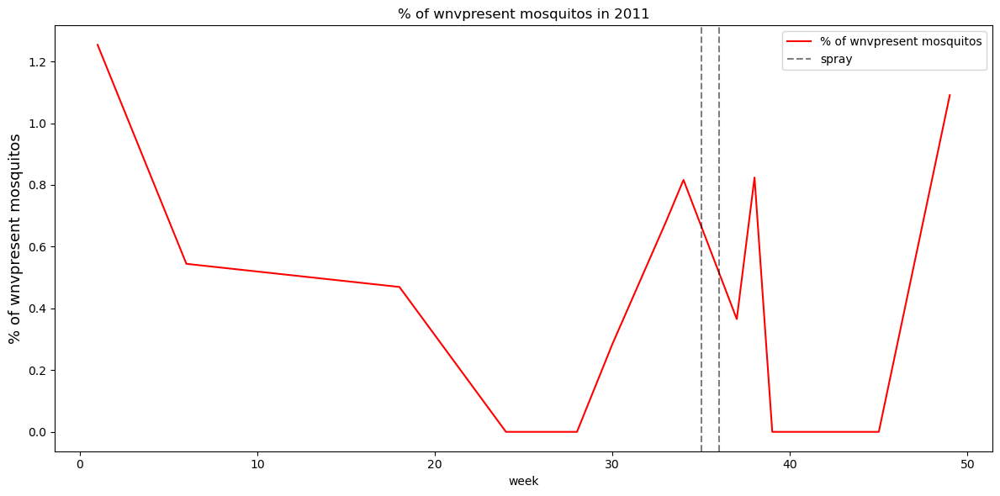

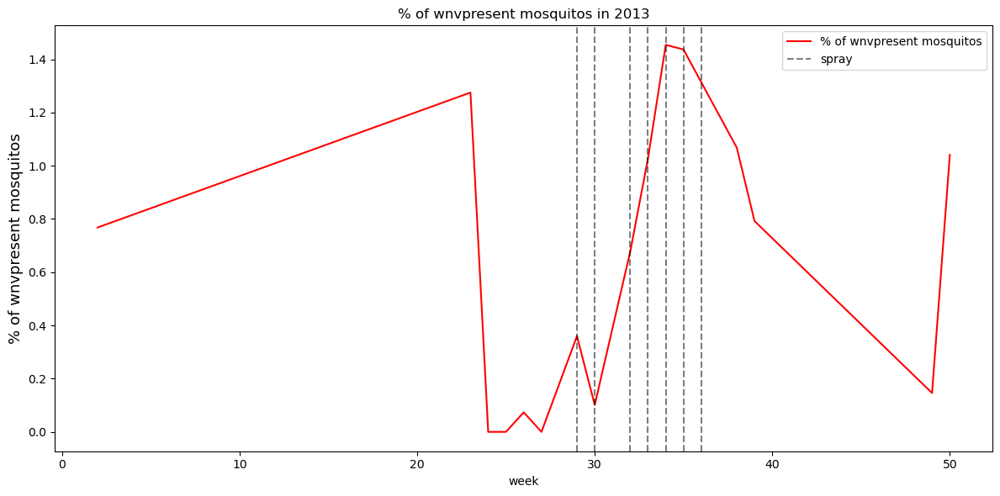

In [313]:
target_plot_c('% of wnvpresent mosquitos', 'red')

In [314]:
train_df_cleaned['date'] = pd.to_datetime(train_df_cleaned.date)
train_df_cleaned['week'] = train_df_cleaned['date'].apply(lambda x: x.week)

spray_df_cleaned['date'] = pd.to_datetime(spray_df_cleaned.date)
spray_df_cleaned['year'] = spray_df_cleaned['date'].apply(lambda x: x.year)
spray_df_cleaned['week'] = spray_df_cleaned['date'].apply(lambda x: x.week)

def target_plot(target, color):
    for year in [2011, 2013]:
        fig, ax1 = plt.subplots(figsize=(12,6))
        temp_df = train_df_cleaned[train_df_cleaned['year']==year].groupby(['week'])[target].sum().to_frame()

        sns.lineplot(x=temp_df.index, y=temp_df[target],
                     ci=None, color=color, label=f'{target}', ax=ax1)
        ax1.set_ylabel(f'{target}', fontsize=13)
        ax1.legend(loc=1)
        
        if year in spray_df_cleaned['year'].unique():
            for date in spray_df_cleaned[spray_df_cleaned['year'] == year].groupby('week').mean().index:
                plt.axvline(date, linestyle='--', color='black', alpha=0.5, label='Spray')
        
        plt.legend([f'{target}', 'spray'])
        plt.title(f'{target} in {year}')
        plt.tight_layout()

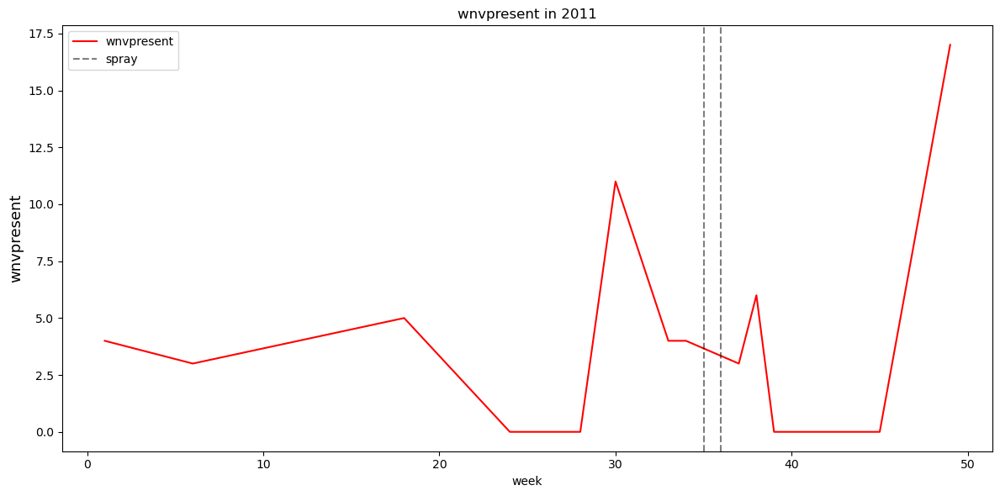

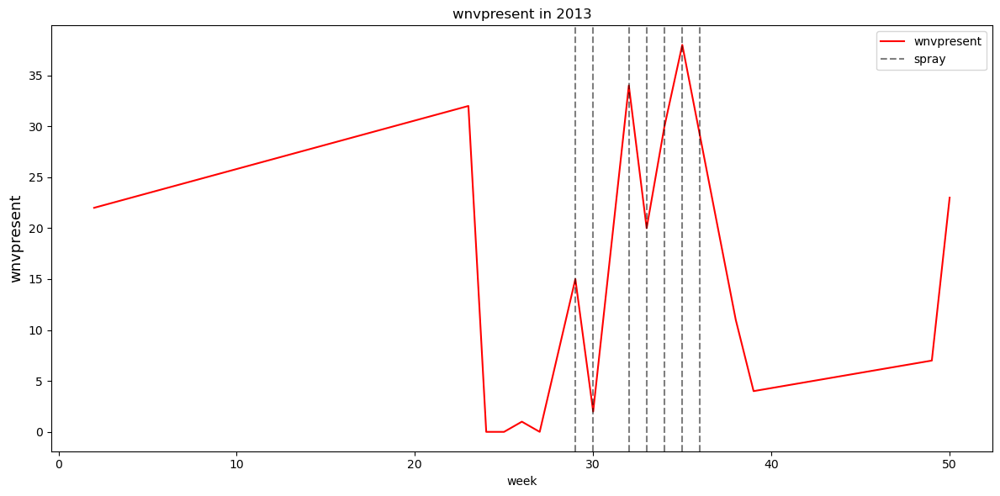

In [315]:
target_plot('wnvpresent', 'red')

Spraying appears to not have any impact on the occurence of West Nile Virus presence or the percentage of mosquitoes with West Nile Virus for both 2011 and 2013.

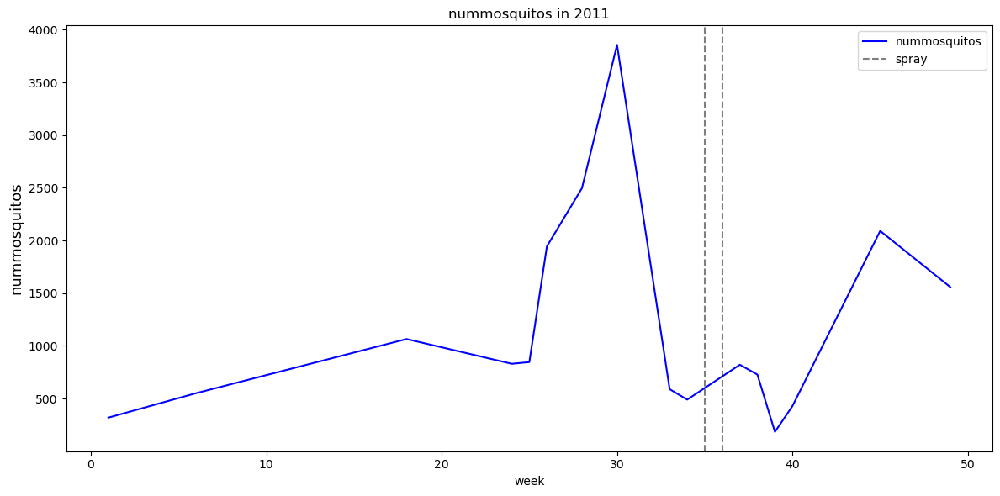

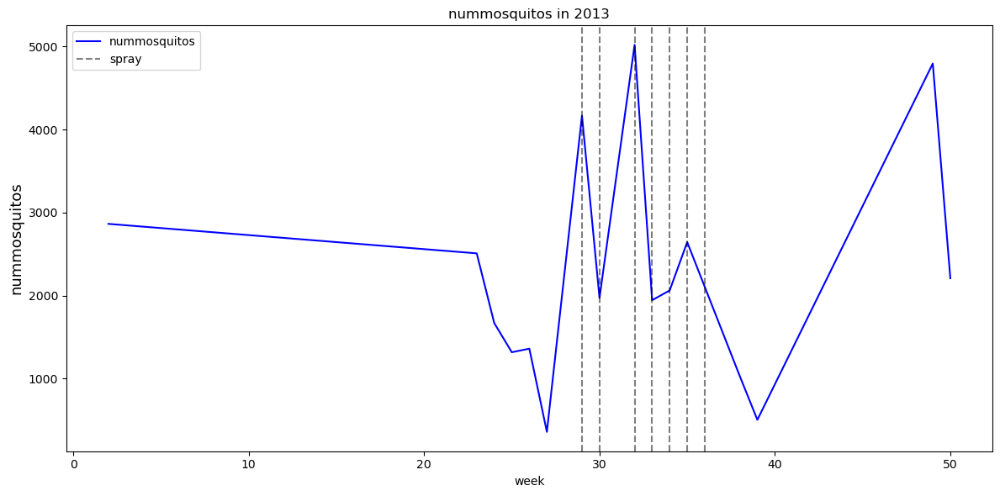

In [316]:
target_plot('nummosquitos', 'blue')

In contrast, spraying appears to be reducing the number of mosquitoes itself for both 2011 and 2013.

However, there may not be enough information on spraying, and there are only 2 weeks of spraying in 2011. More information is required to make more judgements on the effects of spraying

## Interactive Map for Number of Mosquitos that are West Nile Virus Positive

In [317]:
import plotly.express as px

train_df_cleaned['month'] = pd.to_datetime(train_df_cleaned['date']).dt.strftime('%Y-%m')

# Filter the data for WnvPresent == True
wnpositive = train_df_cleaned[train_df_cleaned['wnvpresent'] == True]

# Create the animated heatmap
fig = px.density_mapbox(wnpositive, lat='latitude', lon='longitude', z='nummosquitos', radius=25,
                        center=dict(lat=41.8781, lon=-87.6298), zoom=10,
                        animation_frame='month', title='Heatmap of West Nile Virus Positive Traps Over Time',
                        color_continuous_scale=px.colors.sequential.Blackbody, height=1000, width=900)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})

# Show the plot
fig.show()

## Summary of Preliminary Findings from EDA

### 1. Breakdown of West Nile Virus Presence among mosquito species

West Nile Virus is only present in CULEX PIPIENS/RESTUANS, CULEX PIPIENS and CULEX RESTUANS	species.

CULEX PIPIENS/RESTUANS has slightly higher count of West Nile Virus present mosquitoes, but CULEX PIPIENS has a higher percentage population of mosquitoes as a species that are West Nile Virus Present.
The rest of the 4 species do not have West Nile Virus present mosquitoes. Those 4 species also make up a very small amount of mosquitoes itself as compared to CULEX PIPIENS/RESTUANS, CULEX PIPIENS and CULEX RESTUANS.

### 2. Check target class of wnvpresent : 0 and 1

Target classes are imbalanced, more '0' than '1' for wnvpresent. ('0' denotes WNV not present, '1' denotes WNV present.)

### 3. Check breakdown of West Nile Virus presence by year

2009 and 2011 had much lower West Nile Virus present numbers than 2007 and 2013.

2009 and 2011 also had less number of mosquitoes than 2007 and 2013. However, while 2013 had similar West Nile Virus present numbers as 2007, 2013 had a lower number of mosquitoes than 2007

### 4. Check month vs West Nile Virus Presence

Presence of West Nile Virus occurs most often in August, followed by September. 

### 5. Check average temperature vs West Nile Virus Presence

Generally there is likely more occurence of West Nile Virus presence as the temperature rises above 70 F

### 6. Check wet bulb temperature vs West Nile Virus Presence

Generally the higher the wet bulb temperature, the likely the occurence of West Nile Virus being present is higher.

### 7. Check dewpoint vs West Nile Virus Presence

Generally the higher the dewpoint, the likely the occurence of West Nile Virus being present is higher.

### 8. Check hours of daytime vs West Nile Virus Presence

Generally there appears to be more occurence of West Nile Virus presence as the amount of day time goes higher than 13 hours, before going lower towards 15 hours

### 9. Check precipitation vs West Nile Virus Presence

Generally for time periods from the start of July, there appears to be a rise in the presence of West Nile Virus about 1-2 weeks after a period of rainfall. This may be due to mosquitoes breeding at water bodies left behind after rainfall, where eggs will generally develop into adult mosquitoes in 1-2 weeks which will then be infecting humans and transmitting the virus.

### 10. Check station pressure vs West Nile Virus Presence

There is likely no insights that can be obtained from station pressure.

### 11. Check sea level pressure vs West Nile Virus Presence

There is likely no insights that can be obtained from sea level pressure.

### 12. Check average wind speed vs West Nile Virus Presence

There is likely no insights that can be obtained from average wind speed.

### 13. Using geographic data to visualise the locations of West Nile Virus density

The region with the overall densest concentration of West Nile Virus presence over 2007, 2009, 2011 and 2013 is approximately at latitude and longitude 41.95, -87.8.

### 14. Checking possible effects of spraying

Based on preliminary observation on the map visualisation, West Nile Virus presence hotspots remain dense even when the locations are sprayed. It appears there may not be a discernible impact on spraying on West Nile Virus presence

Spraying appears to not have any impact on the occurence of West Nile Virus presence or the percentage of mosquitoes with West Nile Virus for both 2011 and 2013.

In contrast, spraying appears to be reducing the number of mosquitoes itself for both 2011 and 2013.

However, there may not be enough information on spraying, and there are only 2 weeks of spraying in 2011. More information is required to make more judgements on the effects of spraying